In [1]:
from scipy.io import loadmat
import pandas as pd
import numpy as np
import csv
import matplotlib.pyplot as plt
from IPython.display import display
import warnings
warnings.filterwarnings("ignore")

# Importing Keras modules from TensorFlow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, SimpleRNN, LSTM, Dropout

# Other imports
from sklearn import metrics
from sklearn.metrics import accuracy_score, f1_score, r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.preprocessing import MinMaxScaler

In [2]:
train_data_file = pd.read_csv("train_data2.csv")
print(train_data_file.columns)

Index(['"HDFCBANK_M&M"', '"HDFCBANK_ULTRACEMCO"', '"HDFCBANK_GRASIM"',
       '"HDFCBANK_PIDILITIND"', '"HDFCBANK_LT"', '"HDFCBANK_HINDUNILVR"',
       '"HDFCBANK_ITC"', '"HDFCBANK_RELIANCE"', '"HDFCBANK_ONGC"',
       '"HDFCBANK_UPL"',
       ...
       '"INFY_TATASTEEL"', '"INFY_SUNPHARMA"', '"INFY_CONCOR"',
       '"INFY_BHARTIARTL"', '"TATASTEEL_SUNPHARMA"', '"TATASTEEL_CONCOR"',
       '"TATASTEEL_BHARTIARTL"', '"SUNPHARMA_CONCOR"',
       '"SUNPHARMA_BHARTIARTL"', '"CONCOR_BHARTIARTL"'],
      dtype='object', length=190)


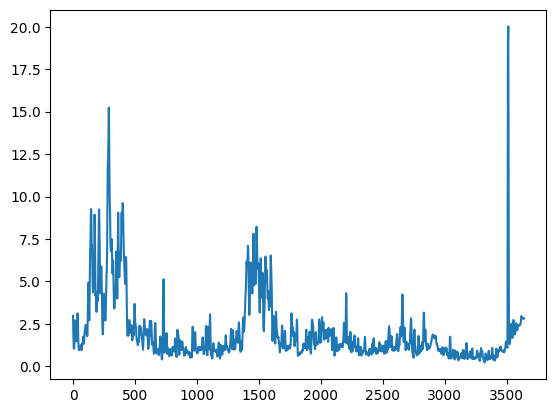

In [3]:
train_price = train_data_file['"HDFCBANK_M&M"']
plt.plot(train_price)

In [4]:
train_data_file['"HDFCBANK_M&M"']

0       2.974444
1       2.680847
2       2.304385
3       1.860661
4       1.517272
          ...   
3634    2.803465
3635    2.794807
3636    2.793349
3637    2.806755
3638    2.830975
Name: "HDFCBANK_M&M", Length: 3639, dtype: float64

In [5]:
test_data_file = pd.read_csv("test_data2.csv")
print(test_data_file.columns)

Index(['"HDFCBANK_M&M"', '"HDFCBANK_ULTRACEMCO"', '"HDFCBANK_GRASIM"',
       '"HDFCBANK_PIDILITIND"', '"HDFCBANK_LT"', '"HDFCBANK_HINDUNILVR"',
       '"HDFCBANK_ITC"', '"HDFCBANK_RELIANCE"', '"HDFCBANK_ONGC"',
       '"HDFCBANK_UPL"',
       ...
       '"INFY_TATASTEEL"', '"INFY_SUNPHARMA"', '"INFY_CONCOR"',
       '"INFY_BHARTIARTL"', '"TATASTEEL_SUNPHARMA"', '"TATASTEEL_CONCOR"',
       '"TATASTEEL_BHARTIARTL"', '"SUNPHARMA_CONCOR"',
       '"SUNPHARMA_BHARTIARTL"', '"CONCOR_BHARTIARTL"'],
      dtype='object', length=190)


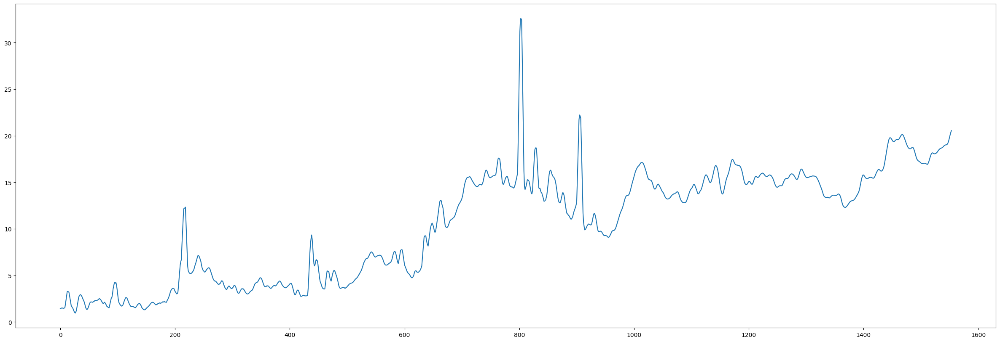

In [6]:
test_price = test_data_file['"RELIANCE_UPL"']
plt.figure(figsize = (30,10))
plt.plot(test_price)

In [7]:
names = train_data_file.columns
names = list(names)
print(names)

['"HDFCBANK_M&M"', '"HDFCBANK_ULTRACEMCO"', '"HDFCBANK_GRASIM"', '"HDFCBANK_PIDILITIND"', '"HDFCBANK_LT"', '"HDFCBANK_HINDUNILVR"', '"HDFCBANK_ITC"', '"HDFCBANK_RELIANCE"', '"HDFCBANK_ONGC"', '"HDFCBANK_UPL"', '"HDFCBANK_ICICIBANK"', '"HDFCBANK_SIEMENS"', '"HDFCBANK_ABB"', '"HDFCBANK_TCS"', '"HDFCBANK_INFY"', '"HDFCBANK_TATASTEEL"', '"HDFCBANK_SUNPHARMA"', '"HDFCBANK_CONCOR"', '"HDFCBANK_BHARTIARTL"', '"M&M_ULTRACEMCO"', '"M&M_GRASIM"', '"M&M_PIDILITIND"', '"M&M_LT"', '"M&M_HINDUNILVR"', '"M&M_ITC"', '"M&M_RELIANCE"', '"M&M_ONGC"', '"M&M_UPL"', '"M&M_ICICIBANK"', '"M&M_SIEMENS"', '"M&M_ABB"', '"M&M_TCS"', '"M&M_INFY"', '"M&M_TATASTEEL"', '"M&M_SUNPHARMA"', '"M&M_CONCOR"', '"M&M_BHARTIARTL"', '"ULTRACEMCO_GRASIM"', '"ULTRACEMCO_PIDILITIND"', '"ULTRACEMCO_LT"', '"ULTRACEMCO_HINDUNILVR"', '"ULTRACEMCO_ITC"', '"ULTRACEMCO_RELIANCE"', '"ULTRACEMCO_ONGC"', '"ULTRACEMCO_UPL"', '"ULTRACEMCO_ICICIBANK"', '"ULTRACEMCO_SIEMENS"', '"ULTRACEMCO_ABB"', '"ULTRACEMCO_TCS"', '"ULTRACEMCO_INFY"', '"ULTR

In [8]:
data = {"A":[1,2,3],"b":[3,4,5],"c":[4,5,6]}
df = pd.DataFrame(data, columns = ["A","b","c"])

In [9]:
df.to_csv("sample_out.csv")

In [10]:
df["A"]

0    1
1    2
2    3
Name: A, dtype: int64

In [11]:
predicted_series_rnn = {}
predicted_series_lstm = {}


***************************************************************************************************************
Pair Number: 0
Epoch 1/35
113/113 [==============================] - 4s 21ms/step - loss: 0.1732
Epoch 2/35
113/113 [==============================] - 3s 23ms/step - loss: 0.0212
Epoch 3/35
113/113 [==============================] - 3s 26ms/step - loss: 0.0091
Epoch 4/35
113/113 [==============================] - 3s 29ms/step - loss: 0.0064
Epoch 5/35
113/113 [==============================] - 4s 33ms/step - loss: 0.0048
Epoch 6/35
113/113 [==============================] - 4s 38ms/step - loss: 0.0036
Epoch 7/35
113/113 [==============================] - 4s 37ms/step - loss: 0.0033
Epoch 8/35
113/113 [==============================] - 4s 34ms/step - loss: 0.0028
Epoch 9/35
113/113 [==============================] - 4s 32ms/step - loss: 0.0023
Epoch 10/35
113/113 [==============================] - 3s 29ms/step - loss: 0.0021
Epoch 11/35
113/113 [==============================

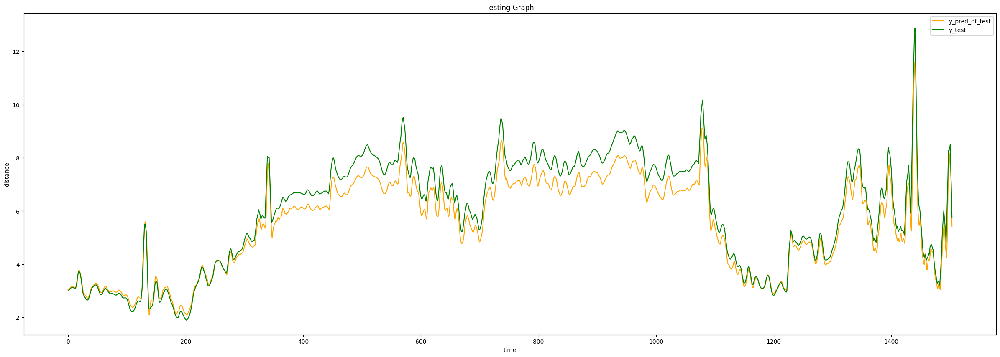


Prediction results:
r2_score:  0.9243752530371248
MAPE:  0.07154910698045856
MAE:  0.475667191570653
RMSE:  0.5644770838175801
_____________________________
Epoch 1/35
113/113 [==============================] - 8s 42ms/step - loss: 0.0067
Epoch 2/35
113/113 [==============================] - 5s 42ms/step - loss: 0.0051
Epoch 3/35
113/113 [==============================] - 5s 41ms/step - loss: 0.0035
Epoch 4/35
113/113 [==============================] - 5s 41ms/step - loss: 0.0029
Epoch 5/35
113/113 [==============================] - 5s 43ms/step - loss: 0.0024
Epoch 6/35
113/113 [==============================] - 5s 40ms/step - loss: 0.0021
Epoch 7/35
113/113 [==============================] - 5s 40ms/step - loss: 0.0018
Epoch 8/35
113/113 [==============================] - 5s 43ms/step - loss: 0.0017
Epoch 9/35
113/113 [==============================] - 5s 41ms/step - loss: 0.0012
Epoch 10/35
113/113 [==============================] - 5s 40ms/step - loss: 0.0010
Epoch 11/35
113/113 [

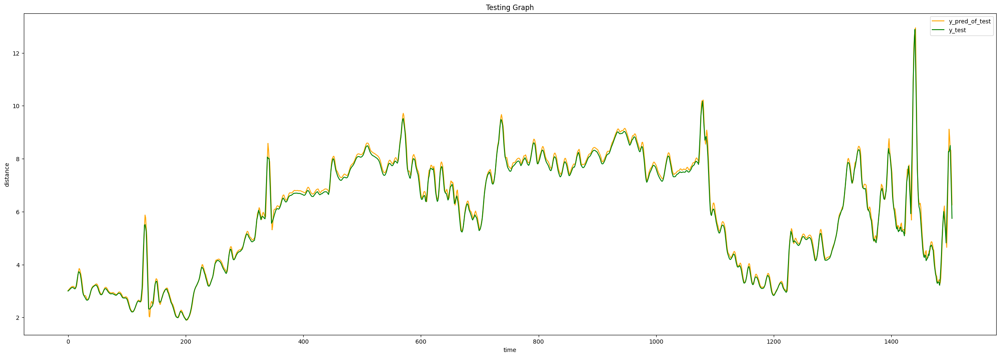


Prediction results:
r2_score:  0.9942303761652661
MAPE:  0.019465636189976356
MAE:  0.11147803630242732
RSME:  0.15591507135005397
['"HDFCBANK_M&M"', [0.9243752530371248, 0.5644770838175801, 0.475667191570653, 0.07154910698045856], [0.9942303761652661, 0.15591507135005397, 0.11147803630242732, 0.019465636189976356]]

***************************************************************************************************************
Pair Number: 1
Epoch 1/35
113/113 [==============================] - 19s 105ms/step - loss: 0.0848
Epoch 2/35
113/113 [==============================] - 12s 106ms/step - loss: 0.0096
Epoch 3/35
113/113 [==============================] - 10s 92ms/step - loss: 0.0047
Epoch 4/35
113/113 [==============================] - 8s 70ms/step - loss: 0.0033
Epoch 5/35
113/113 [==============================] - 8s 67ms/step - loss: 0.0029
Epoch 6/35
113/113 [==============================] - 9s 78ms/step - loss: 0.0022
Epoch 7/35
113/113 [==============================] - 11

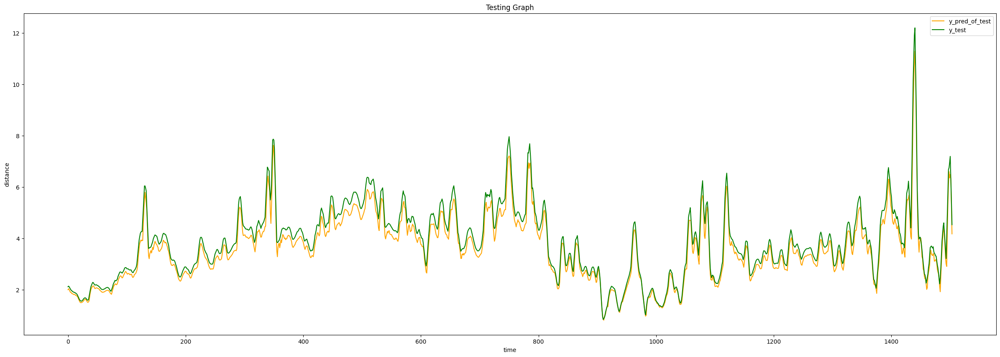


Prediction results:
r2_score:  0.9445780648510905
MAPE:  0.06950568419900652
MAE:  0.2818617242721542
RMSE:  0.32443203301380863
_____________________________
Epoch 1/35
113/113 [==============================] - 15s 74ms/step - loss: 0.0035
Epoch 2/35
113/113 [==============================] - 7s 61ms/step - loss: 0.0030
Epoch 3/35
113/113 [==============================] - 8s 72ms/step - loss: 0.0025
Epoch 4/35
113/113 [==============================] - 8s 72ms/step - loss: 0.0021
Epoch 5/35
113/113 [==============================] - 4s 37ms/step - loss: 0.0017
Epoch 6/35
113/113 [==============================] - 4s 34ms/step - loss: 0.0012
Epoch 7/35
113/113 [==============================] - 4s 35ms/step - loss: 0.0010
Epoch 8/35
113/113 [==============================] - 4s 35ms/step - loss: 7.5353e-04
Epoch 9/35
113/113 [==============================] - 5s 41ms/step - loss: 6.0937e-04
Epoch 10/35
113/113 [==============================] - 6s 54ms/step - loss: 5.0987e-04
Epoch 

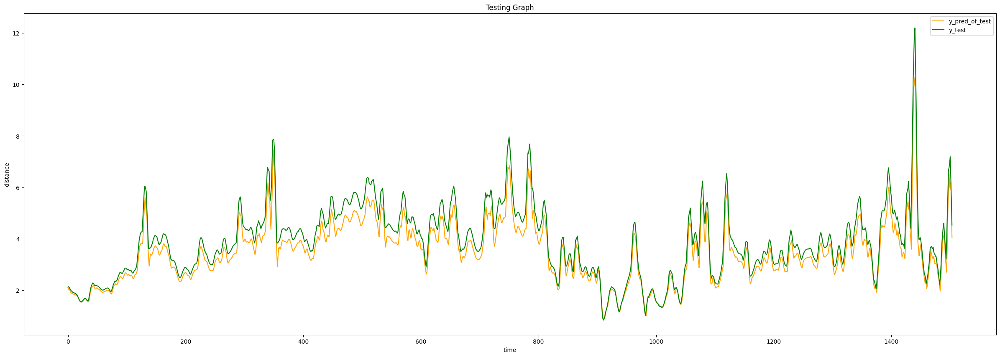


Prediction results:
r2_score:  0.8854708402580697
MAPE:  0.09303077521543869
MAE:  0.3944658381803684
RSME:  0.4663810784422087
['"HDFCBANK_ULTRACEMCO"', [0.9445780648510905, 0.32443203301380863, 0.2818617242721542, 0.06950568419900652], [0.8854708402580697, 0.4663810784422087, 0.3944658381803684, 0.09303077521543869]]

***************************************************************************************************************
Pair Number: 2
Epoch 1/35
113/113 [==============================] - 8s 40ms/step - loss: 0.0674
Epoch 2/35
113/113 [==============================] - 5s 42ms/step - loss: 0.0088
Epoch 3/35
113/113 [==============================] - 4s 35ms/step - loss: 0.0048
Epoch 4/35
113/113 [==============================] - 4s 34ms/step - loss: 0.0032
Epoch 5/35
113/113 [==============================] - 4s 33ms/step - loss: 0.0026
Epoch 6/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0022
Epoch 7/35
113/113 [==============================] - 4s 3

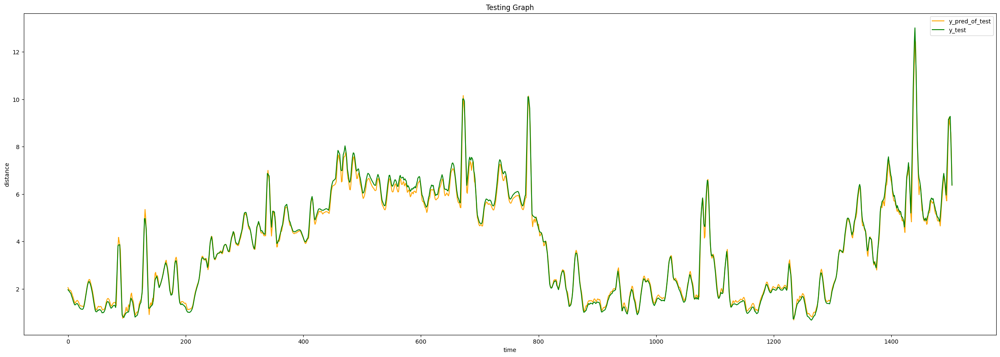


Prediction results:
r2_score:  0.9930043683262078
MAPE:  0.04764554325349221
MAE:  0.13958221223192815
RMSE:  0.18726407600137604
_____________________________
Epoch 1/35
113/113 [==============================] - 21s 107ms/step - loss: 0.0040
Epoch 2/35
113/113 [==============================] - 18s 162ms/step - loss: 0.0026
Epoch 3/35
113/113 [==============================] - 17s 150ms/step - loss: 0.0020
Epoch 4/35
113/113 [==============================] - 15s 130ms/step - loss: 0.0016
Epoch 5/35
113/113 [==============================] - 15s 129ms/step - loss: 0.0012
Epoch 6/35
113/113 [==============================] - 14s 124ms/step - loss: 0.0011
Epoch 7/35
113/113 [==============================] - 16s 142ms/step - loss: 9.2259e-04
Epoch 8/35
113/113 [==============================] - 16s 142ms/step - loss: 8.1229e-04
Epoch 9/35
113/113 [==============================] - 14s 122ms/step - loss: 7.4305e-04
Epoch 10/35
113/113 [==============================] - 17s 149ms/step -

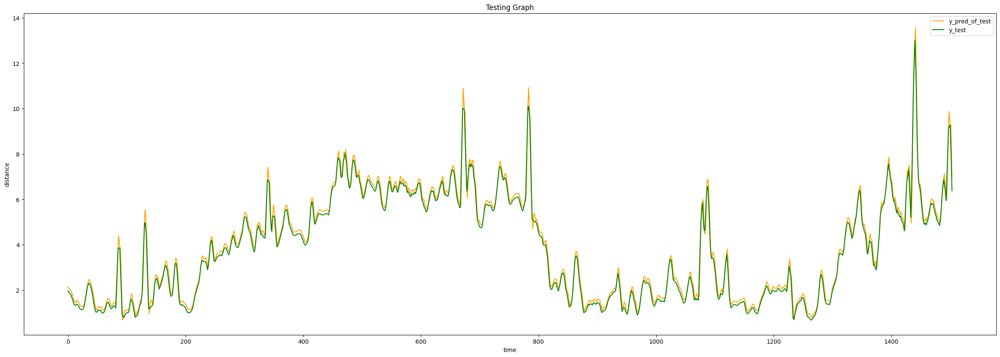


Prediction results:
r2_score:  0.9898292437271613
MAPE:  0.06518786625545171
MAE:  0.17874184669431997
RSME:  0.22579671948147464
['"HDFCBANK_GRASIM"', [0.9930043683262078, 0.18726407600137604, 0.13958221223192815, 0.04764554325349221], [0.9898292437271613, 0.22579671948147464, 0.17874184669431997, 0.06518786625545171]]

***************************************************************************************************************
Pair Number: 3
Epoch 1/35
113/113 [==============================] - 9s 45ms/step - loss: 0.0677
Epoch 2/35
113/113 [==============================] - 4s 37ms/step - loss: 0.0105
Epoch 3/35
113/113 [==============================] - 4s 35ms/step - loss: 0.0053
Epoch 4/35
113/113 [==============================] - 4s 35ms/step - loss: 0.0037
Epoch 5/35
113/113 [==============================] - 4s 36ms/step - loss: 0.0026
Epoch 6/35
113/113 [==============================] - 4s 31ms/step - loss: 0.0024
Epoch 7/35
113/113 [==============================] - 4s 

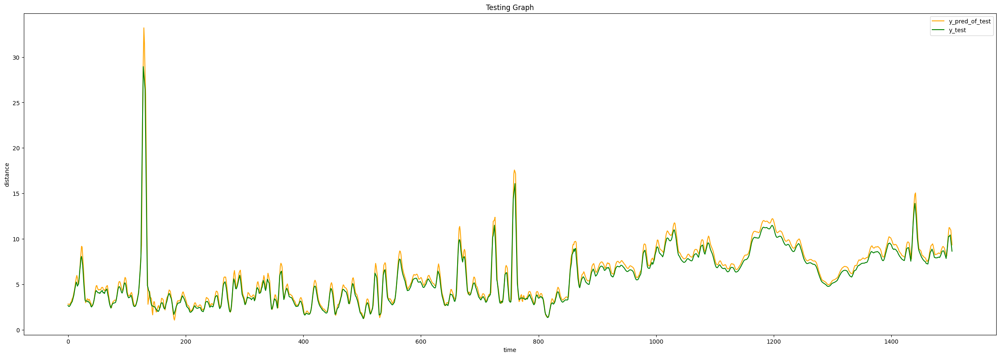


Prediction results:
r2_score:  0.9615819341726392
MAPE:  0.07912990904031238
MAE:  0.4304362822743835
RMSE:  0.5734105074361717
_____________________________
Epoch 1/35
113/113 [==============================] - 9s 43ms/step - loss: 0.0043
Epoch 2/35
113/113 [==============================] - 5s 46ms/step - loss: 0.0039
Epoch 3/35
113/113 [==============================] - 5s 43ms/step - loss: 0.0029
Epoch 4/35
113/113 [==============================] - 5s 42ms/step - loss: 0.0021
Epoch 5/35
113/113 [==============================] - 5s 45ms/step - loss: 0.0016
Epoch 6/35
113/113 [==============================] - 5s 42ms/step - loss: 0.0011
Epoch 7/35
113/113 [==============================] - 5s 42ms/step - loss: 9.3192e-04
Epoch 8/35
113/113 [==============================] - 5s 46ms/step - loss: 6.5632e-04
Epoch 9/35
113/113 [==============================] - 5s 43ms/step - loss: 6.1576e-04
Epoch 10/35
113/113 [==============================] - 5s 42ms/step - loss: 6.1670e-04
Epoc

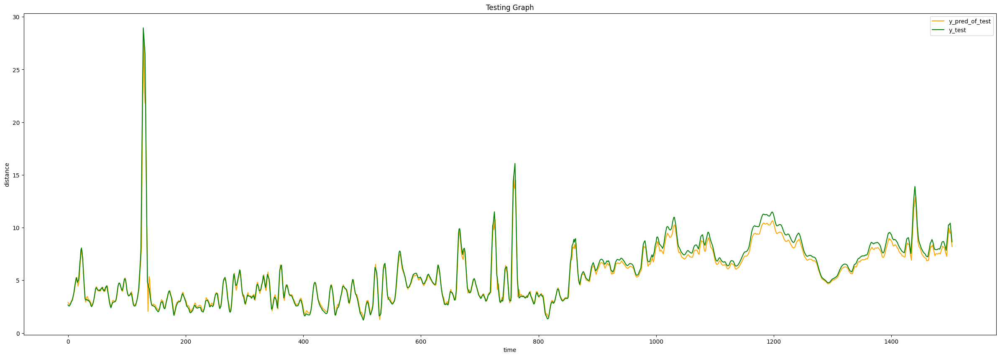


Prediction results:
r2_score:  0.973987999517922
MAPE:  0.05349628343889678
MAE:  0.3145068596116809
RSME:  0.47182915755748467
['"HDFCBANK_PIDILITIND"', [0.9615819341726392, 0.5734105074361717, 0.4304362822743835, 0.07912990904031238], [0.973987999517922, 0.47182915755748467, 0.3145068596116809, 0.05349628343889678]]

***************************************************************************************************************
Pair Number: 4
Epoch 1/35
113/113 [==============================] - 5s 28ms/step - loss: 0.0608
Epoch 2/35
113/113 [==============================] - 3s 29ms/step - loss: 0.0078
Epoch 3/35
113/113 [==============================] - 4s 33ms/step - loss: 0.0042
Epoch 4/35
113/113 [==============================] - 3s 29ms/step - loss: 0.0026
Epoch 5/35
113/113 [==============================] - 3s 29ms/step - loss: 0.0018
Epoch 6/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0016
Epoch 7/35
113/113 [==============================] - 3s 31

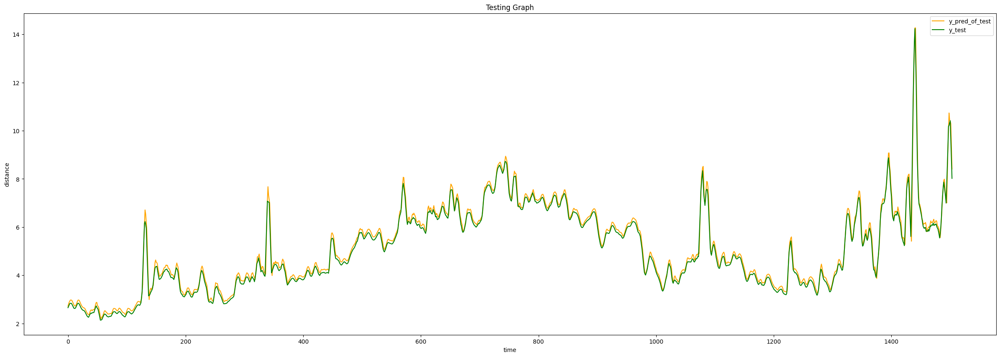


Prediction results:
r2_score:  0.9900836718556119
MAPE:  0.029441216708528777
MAE:  0.1386819721365212
RMSE:  0.16691498605788832
_____________________________
Epoch 1/35
113/113 [==============================] - 9s 46ms/step - loss: 0.0028
Epoch 2/35
113/113 [==============================] - 6s 49ms/step - loss: 0.0020
Epoch 3/35
113/113 [==============================] - 6s 51ms/step - loss: 0.0015
Epoch 4/35
113/113 [==============================] - 5s 45ms/step - loss: 0.0010
Epoch 5/35
113/113 [==============================] - 6s 52ms/step - loss: 6.9362e-04
Epoch 6/35
113/113 [==============================] - 5s 46ms/step - loss: 5.7413e-04
Epoch 7/35
113/113 [==============================] - 5s 46ms/step - loss: 5.2115e-04
Epoch 8/35
113/113 [==============================] - 5s 47ms/step - loss: 5.2306e-04
Epoch 9/35
113/113 [==============================] - 5s 44ms/step - loss: 3.6801e-04
Epoch 10/35
113/113 [==============================] - 5s 46ms/step - loss: 3.282

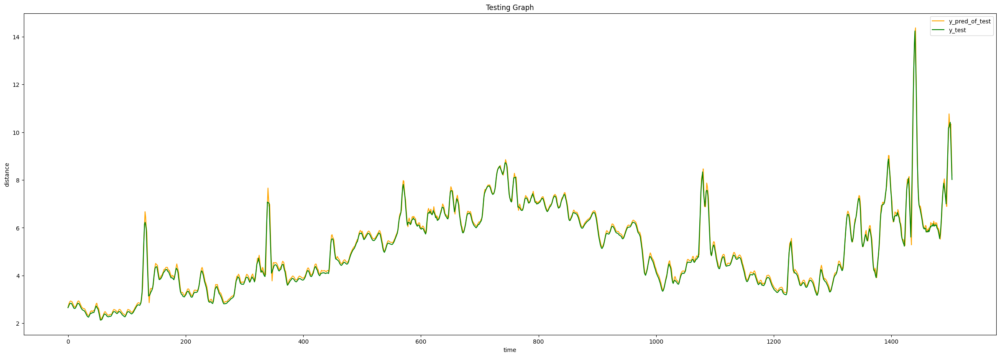


Prediction results:
r2_score:  0.9934628082611809
MAPE:  0.021003696528009066
MAE:  0.09940313931580029
RSME:  0.13552377714573471
['"HDFCBANK_LT"', [0.9900836718556119, 0.16691498605788832, 0.1386819721365212, 0.029441216708528777], [0.9934628082611809, 0.13552377714573471, 0.09940313931580029, 0.021003696528009066]]

***************************************************************************************************************
Pair Number: 5
Epoch 1/35
113/113 [==============================] - 6s 30ms/step - loss: 0.0453
Epoch 2/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0063
Epoch 3/35
113/113 [==============================] - 4s 33ms/step - loss: 0.0034
Epoch 4/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0023
Epoch 5/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0017
Epoch 6/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0015
Epoch 7/35
113/113 [==============================] - 3s 31

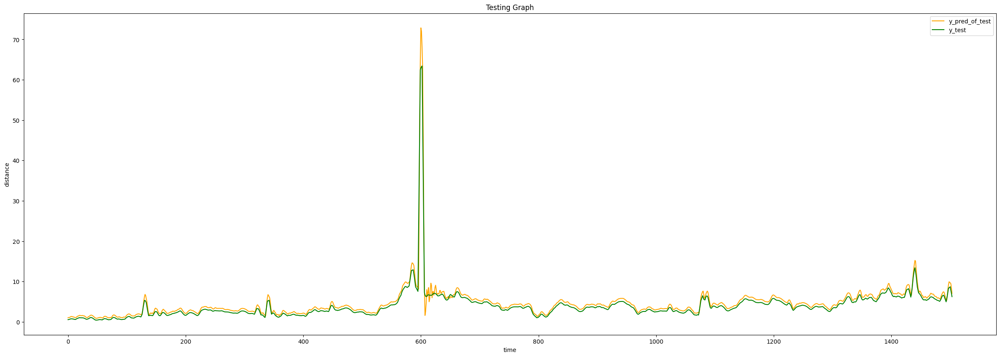


Prediction results:
r2_score:  0.9448402790539984
MAPE:  0.2361367632970551
MAE:  0.7088493576318479
RMSE:  0.9912354711878947
_____________________________
Epoch 1/35
113/113 [==============================] - 8s 42ms/step - loss: 0.0031
Epoch 2/35
113/113 [==============================] - 5s 45ms/step - loss: 0.0019
Epoch 3/35
113/113 [==============================] - 5s 42ms/step - loss: 0.0012
Epoch 4/35
113/113 [==============================] - 5s 42ms/step - loss: 8.0891e-04
Epoch 5/35
113/113 [==============================] - 5s 43ms/step - loss: 6.2826e-04
Epoch 6/35
113/113 [==============================] - 5s 44ms/step - loss: 5.5067e-04
Epoch 7/35
113/113 [==============================] - 5s 42ms/step - loss: 4.6529e-04
Epoch 8/35
113/113 [==============================] - 5s 42ms/step - loss: 4.1808e-04
Epoch 9/35
113/113 [==============================] - 6s 53ms/step - loss: 2.9978e-04
Epoch 10/35
113/113 [==============================] - 5s 42ms/step - loss: 3.41

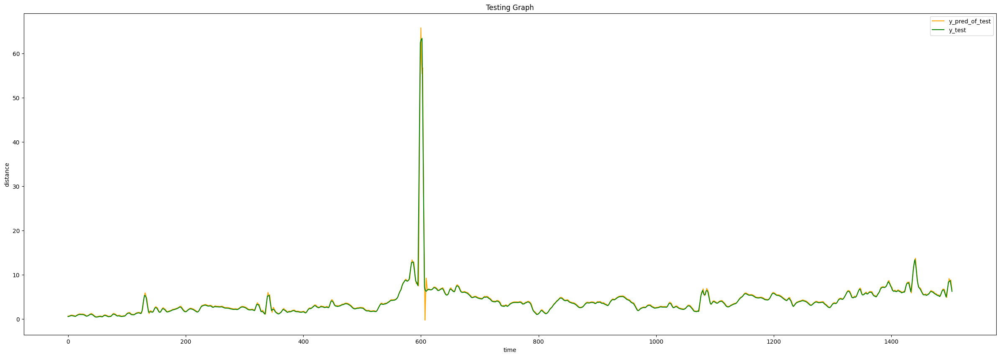


Prediction results:
r2_score:  0.9782642135733259
MAPE:  0.05755017829763129
MAE:  0.20235508706447516
RSME:  0.6222336354859224
['"HDFCBANK_HINDUNILVR"', [0.9448402790539984, 0.9912354711878947, 0.7088493576318479, 0.2361367632970551], [0.9782642135733259, 0.6222336354859224, 0.20235508706447516, 0.05755017829763129]]

***************************************************************************************************************
Pair Number: 6
Epoch 1/35
113/113 [==============================] - 6s 31ms/step - loss: 0.0549
Epoch 2/35
113/113 [==============================] - 4s 31ms/step - loss: 0.0070
Epoch 3/35
113/113 [==============================] - 3s 29ms/step - loss: 0.0034
Epoch 4/35
113/113 [==============================] - 3s 29ms/step - loss: 0.0024
Epoch 5/35
113/113 [==============================] - 3s 29ms/step - loss: 0.0017
Epoch 6/35
113/113 [==============================] - 4s 32ms/step - loss: 0.0013
Epoch 7/35
113/113 [==============================] - 3s 3

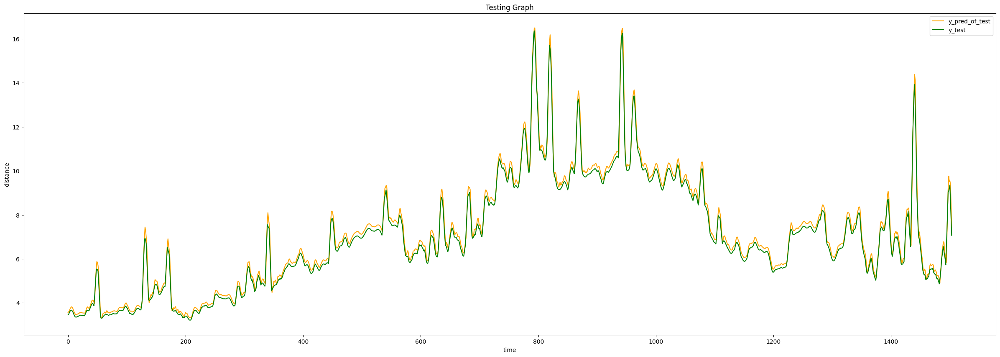


Prediction results:
r2_score:  0.9919731201212225
MAPE:  0.028870389519306042
MAE:  0.19425482712004669
RMSE:  0.22017516752461588
_____________________________
Epoch 1/35
113/113 [==============================] - 8s 46ms/step - loss: 0.0039
Epoch 2/35
113/113 [==============================] - 5s 47ms/step - loss: 0.0024
Epoch 3/35
113/113 [==============================] - 5s 46ms/step - loss: 0.0016
Epoch 4/35
113/113 [==============================] - 5s 46ms/step - loss: 0.0011
Epoch 5/35
113/113 [==============================] - 5s 48ms/step - loss: 8.0150e-04
Epoch 6/35
113/113 [==============================] - 5s 45ms/step - loss: 5.8623e-04
Epoch 7/35
113/113 [==============================] - 5s 45ms/step - loss: 5.6397e-04
Epoch 8/35
113/113 [==============================] - 6s 55ms/step - loss: 4.5871e-04
Epoch 9/35
113/113 [==============================] - 8s 69ms/step - loss: 4.1457e-04
Epoch 10/35
113/113 [==============================] - 6s 56ms/step - loss: 3.66

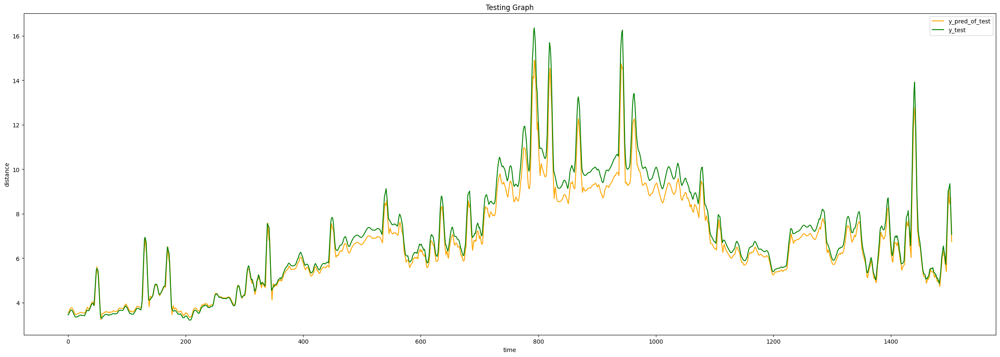


Prediction results:
r2_score:  0.9623679243824326
MAPE:  0.04609433683721711
MAE:  0.3701530072681048
RSME:  0.47673170970390083
['"HDFCBANK_ITC"', [0.9919731201212225, 0.22017516752461588, 0.19425482712004669, 0.028870389519306042], [0.9623679243824326, 0.47673170970390083, 0.3701530072681048, 0.04609433683721711]]

***************************************************************************************************************
Pair Number: 7
Epoch 1/35
113/113 [==============================] - 6s 31ms/step - loss: 0.1419
Epoch 2/35
113/113 [==============================] - 4s 31ms/step - loss: 0.0185
Epoch 3/35
113/113 [==============================] - 3s 29ms/step - loss: 0.0090
Epoch 4/35
113/113 [==============================] - 3s 29ms/step - loss: 0.0054
Epoch 5/35
113/113 [==============================] - 3s 29ms/step - loss: 0.0035
Epoch 6/35
113/113 [==============================] - 4s 33ms/step - loss: 0.0027
Epoch 7/35
113/113 [==============================] - 3s 30ms

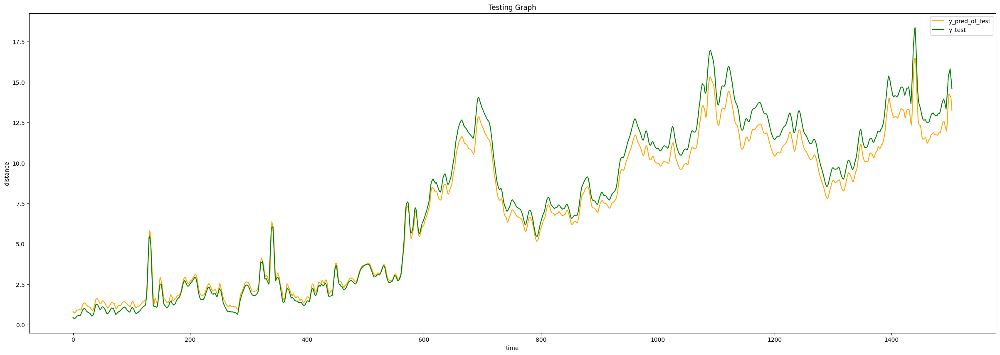


Prediction results:
r2_score:  0.9741322539434645
MAPE:  0.11946493635672413
MAE:  0.6467242164260392
RMSE:  0.7776241873000396
_____________________________
Epoch 1/35
113/113 [==============================] - 8s 45ms/step - loss: 0.0042
Epoch 2/35
113/113 [==============================] - 5s 43ms/step - loss: 0.0028
Epoch 3/35
113/113 [==============================] - 5s 42ms/step - loss: 0.0023
Epoch 4/35
113/113 [==============================] - 5s 47ms/step - loss: 0.0017
Epoch 5/35
113/113 [==============================] - 5s 47ms/step - loss: 0.0011
Epoch 6/35
113/113 [==============================] - 5s 44ms/step - loss: 0.0010
Epoch 7/35
113/113 [==============================] - 5s 44ms/step - loss: 6.9250e-04
Epoch 8/35
113/113 [==============================] - 5s 48ms/step - loss: 6.7435e-04
Epoch 9/35
113/113 [==============================] - 5s 44ms/step - loss: 8.0812e-04
Epoch 10/35
113/113 [==============================] - 5s 45ms/step - loss: 5.0590e-04
Epoc

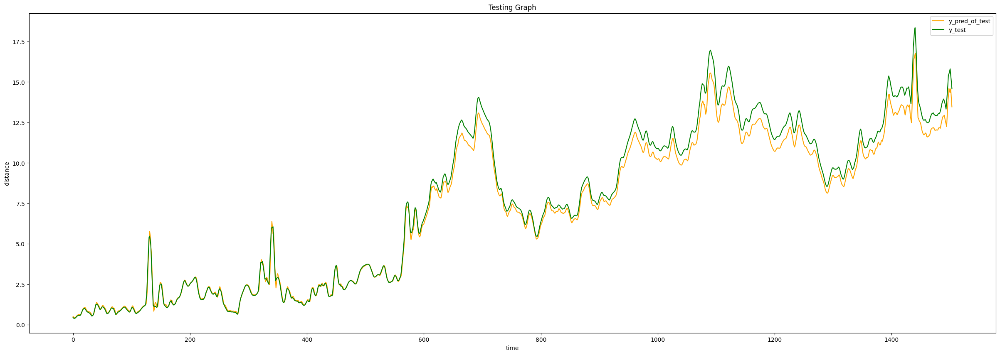


Prediction results:
r2_score:  0.985176575877384
MAPE:  0.05251580564415563
MAE:  0.44459105445954417
RSME:  0.5886602809682109
['"HDFCBANK_RELIANCE"', [0.9741322539434645, 0.7776241873000396, 0.6467242164260392, 0.11946493635672413], [0.985176575877384, 0.5886602809682109, 0.44459105445954417, 0.05251580564415563]]

***************************************************************************************************************
Pair Number: 8
Epoch 1/35
113/113 [==============================] - 5s 29ms/step - loss: 0.1145
Epoch 2/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0201
Epoch 3/35
113/113 [==============================] - 4s 33ms/step - loss: 0.0084
Epoch 4/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0057
Epoch 5/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0037
Epoch 6/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0032
Epoch 7/35
113/113 [==============================] - 3s 31ms

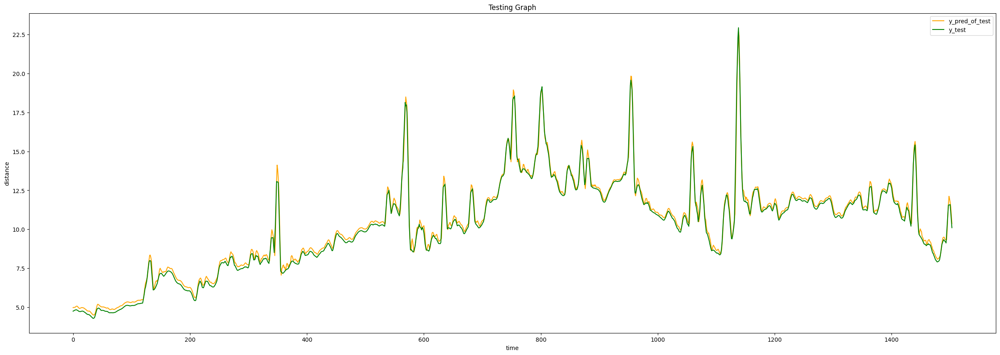


Prediction results:
r2_score:  0.9930623455691471
MAPE:  0.022100255077156503
MAE:  0.20509134996458042
RMSE:  0.24596305346408445
_____________________________
Epoch 1/35
113/113 [==============================] - 8s 43ms/step - loss: 0.0042
Epoch 2/35
113/113 [==============================] - 5s 47ms/step - loss: 0.0033
Epoch 3/35
113/113 [==============================] - 5s 44ms/step - loss: 0.0026
Epoch 4/35
113/113 [==============================] - 5s 43ms/step - loss: 0.0020
Epoch 5/35
113/113 [==============================] - 5s 45ms/step - loss: 0.0014
Epoch 6/35
113/113 [==============================] - 5s 45ms/step - loss: 0.0011
Epoch 7/35
113/113 [==============================] - 5s 43ms/step - loss: 8.5274e-04
Epoch 8/35
113/113 [==============================] - 5s 44ms/step - loss: 8.3775e-04
Epoch 9/35
113/113 [==============================] - 5s 46ms/step - loss: 6.1943e-04
Epoch 10/35
113/113 [==============================] - 5s 43ms/step - loss: 5.0956e-04
E

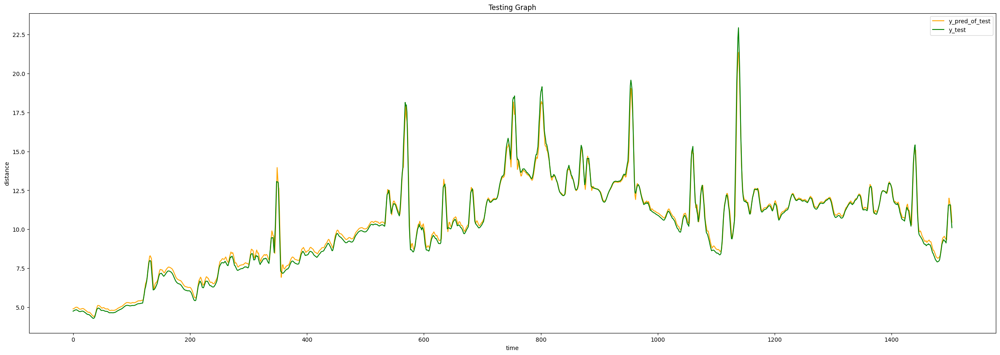


Prediction results:
r2_score:  0.9917024193557704
MAPE:  0.02096344101621942
MAE:  0.19946052927802133
RSME:  0.26899195114246627
['"HDFCBANK_ONGC"', [0.9930623455691471, 0.24596305346408445, 0.20509134996458042, 0.022100255077156503], [0.9917024193557704, 0.26899195114246627, 0.19946052927802133, 0.02096344101621942]]

***************************************************************************************************************
Pair Number: 9
Epoch 1/35
113/113 [==============================] - 6s 32ms/step - loss: 0.0428
Epoch 2/35
113/113 [==============================] - 4s 31ms/step - loss: 0.0053
Epoch 3/35
113/113 [==============================] - 3s 31ms/step - loss: 0.0033
Epoch 4/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0026
Epoch 5/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0018
Epoch 6/35
113/113 [==============================] - 4s 33ms/step - loss: 0.0015
Epoch 7/35
113/113 [==============================] - 3s 3

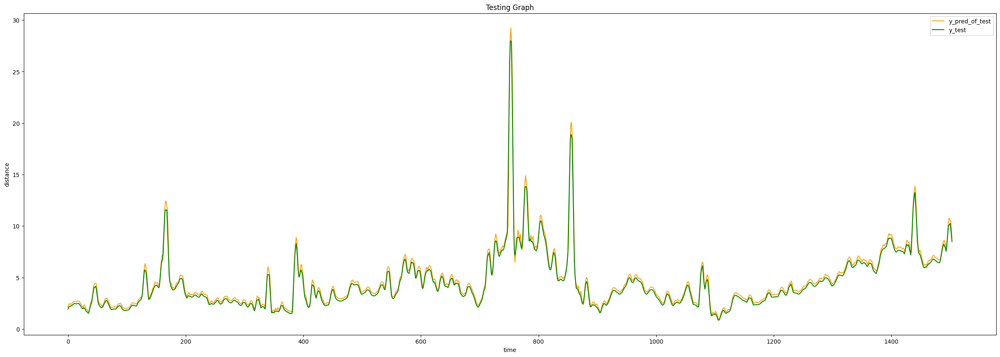


Prediction results:
r2_score:  0.9851200620282875
MAPE:  0.07083295476733101
MAE:  0.27927795011210177
RMSE:  0.33925780009204143
_____________________________
Epoch 1/35
113/113 [==============================] - 9s 49ms/step - loss: 0.0059
Epoch 2/35
113/113 [==============================] - 5s 44ms/step - loss: 0.0041
Epoch 3/35
113/113 [==============================] - 9s 77ms/step - loss: 0.0029
Epoch 4/35
113/113 [==============================] - 6s 54ms/step - loss: 0.0019
Epoch 5/35
113/113 [==============================] - 5s 48ms/step - loss: 0.0014
Epoch 6/35
113/113 [==============================] - 6s 49ms/step - loss: 0.0011
Epoch 7/35
113/113 [==============================] - 5s 44ms/step - loss: 9.2905e-04
Epoch 8/35
113/113 [==============================] - 5s 44ms/step - loss: 8.7808e-04
Epoch 9/35
113/113 [==============================] - 5s 48ms/step - loss: 6.9331e-04
Epoch 10/35
113/113 [==============================] - 5s 43ms/step - loss: 9.7877e-04
Ep

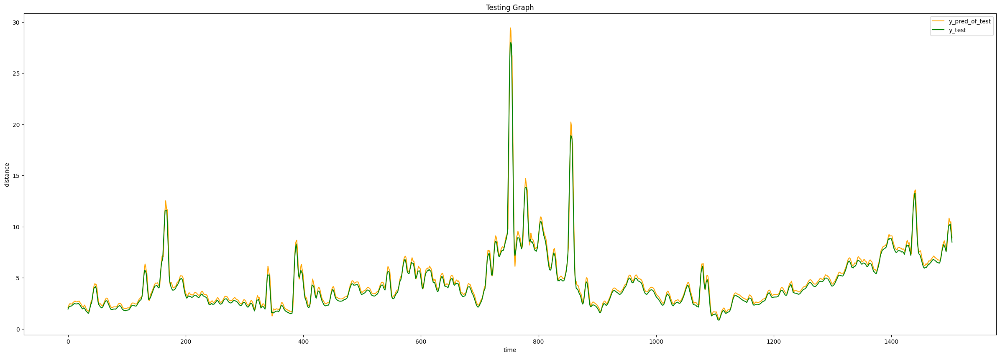


Prediction results:
r2_score:  0.9830253680176374
MAPE:  0.07249986528418612
MAE:  0.28316150170482873
RSME:  0.36235100054461067
['"HDFCBANK_UPL"', [0.9851200620282875, 0.33925780009204143, 0.27927795011210177, 0.07083295476733101], [0.9830253680176374, 0.36235100054461067, 0.28316150170482873, 0.07249986528418612]]

***************************************************************************************************************
Pair Number: 10
Epoch 1/35
113/113 [==============================] - 6s 29ms/step - loss: 0.0569
Epoch 2/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0074
Epoch 3/35
113/113 [==============================] - 4s 31ms/step - loss: 0.0045
Epoch 4/35
113/113 [==============================] - 4s 32ms/step - loss: 0.0031
Epoch 5/35
113/113 [==============================] - 4s 36ms/step - loss: 0.0021
Epoch 6/35
113/113 [==============================] - 4s 34ms/step - loss: 0.0016
Epoch 7/35
113/113 [==============================] - 3s 30

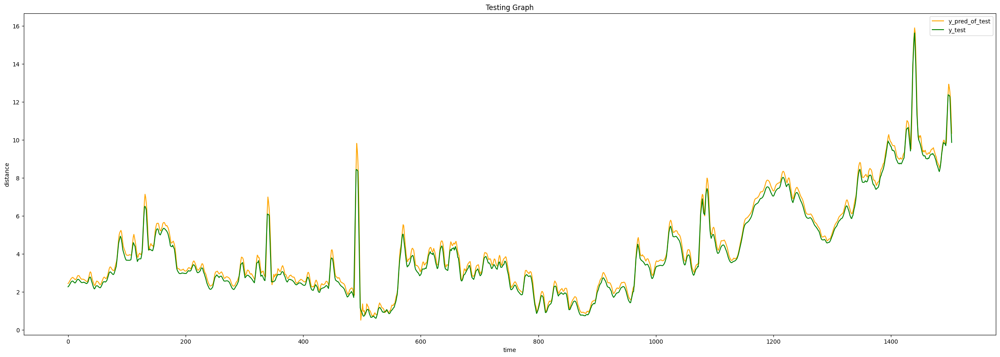


Prediction results:
r2_score:  0.988515828659669
MAPE:  0.07274634093065498
MAE:  0.23220666237108736
RMSE:  0.2640416705063326
_____________________________
Epoch 1/35
113/113 [==============================] - 9s 47ms/step - loss: 0.0023
Epoch 2/35
113/113 [==============================] - 5s 45ms/step - loss: 0.0018
Epoch 3/35
113/113 [==============================] - 5s 48ms/step - loss: 0.0014
Epoch 4/35
113/113 [==============================] - 5s 47ms/step - loss: 0.0011
Epoch 5/35
113/113 [==============================] - 5s 45ms/step - loss: 9.1161e-04
Epoch 6/35
113/113 [==============================] - 5s 47ms/step - loss: 5.8633e-04
Epoch 7/35
113/113 [==============================] - 5s 48ms/step - loss: 4.6343e-04
Epoch 8/35
113/113 [==============================] - 5s 45ms/step - loss: 4.3578e-04
Epoch 9/35
113/113 [==============================] - 5s 46ms/step - loss: 4.3713e-04
Epoch 10/35
113/113 [==============================] - 5s 48ms/step - loss: 3.4398e

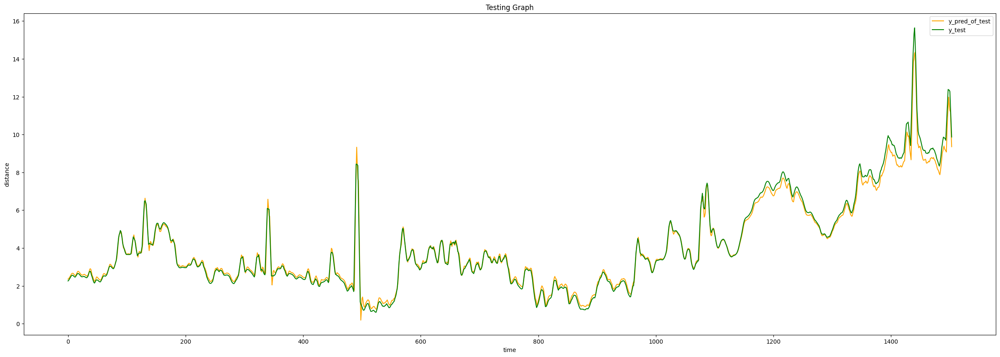


Prediction results:
r2_score:  0.9901502135003
MAPE:  0.04993912990521244
MAE:  0.16684388595953514
RSME:  0.24453219628208003
['"HDFCBANK_ICICIBANK"', [0.988515828659669, 0.2640416705063326, 0.23220666237108736, 0.07274634093065498], [0.9901502135003, 0.24453219628208003, 0.16684388595953514, 0.04993912990521244]]

***************************************************************************************************************
Pair Number: 11
Epoch 1/35
113/113 [==============================] - 6s 30ms/step - loss: 0.0781
Epoch 2/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0127
Epoch 3/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0057
Epoch 4/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0044
Epoch 5/35
113/113 [==============================] - 4s 33ms/step - loss: 0.0026
Epoch 6/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0024
Epoch 7/35
113/113 [==============================] - 3s 30ms

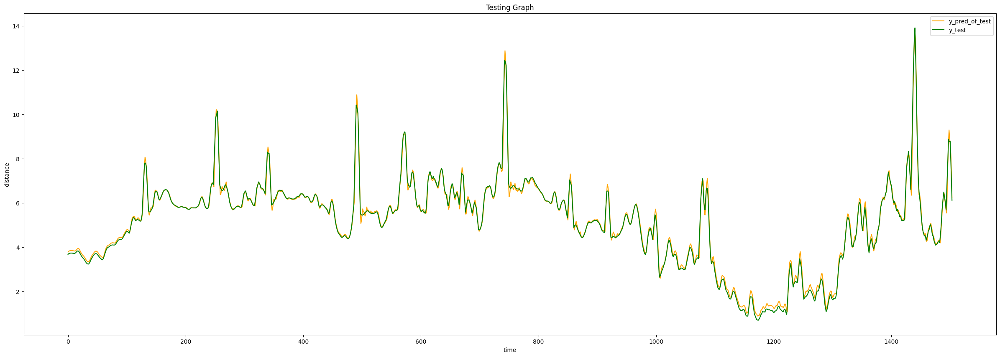


Prediction results:
r2_score:  0.9937828441681776
MAPE:  0.03034134098176739
MAE:  0.10148481412514301
RMSE:  0.15225858991911362
_____________________________
Epoch 1/35
113/113 [==============================] - 8s 44ms/step - loss: 0.0050
Epoch 2/35
113/113 [==============================] - 5s 43ms/step - loss: 0.0036
Epoch 3/35
113/113 [==============================] - 5s 42ms/step - loss: 0.0027
Epoch 4/35
113/113 [==============================] - 5s 45ms/step - loss: 0.0020
Epoch 5/35
113/113 [==============================] - 5s 42ms/step - loss: 0.0015
Epoch 6/35
113/113 [==============================] - 5s 42ms/step - loss: 9.9490e-04
Epoch 7/35
113/113 [==============================] - 5s 46ms/step - loss: 0.0010
Epoch 8/35
113/113 [==============================] - 5s 42ms/step - loss: 5.6869e-04
Epoch 9/35
113/113 [==============================] - 5s 43ms/step - loss: 5.4625e-04
Epoch 10/35
113/113 [==============================] - 5s 46ms/step - loss: 4.8717e-04
Ep

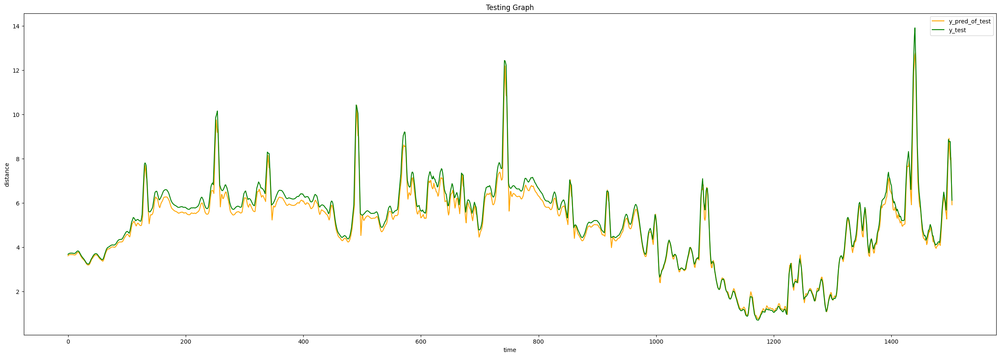


Prediction results:
r2_score:  0.9773253423439
MAPE:  0.04356370618763486
MAE:  0.2282918856641063
RSME:  0.29077448573972836
['"HDFCBANK_SIEMENS"', [0.9937828441681776, 0.15225858991911362, 0.10148481412514301, 0.03034134098176739], [0.9773253423439, 0.29077448573972836, 0.2282918856641063, 0.04356370618763486]]

***************************************************************************************************************
Pair Number: 12
Epoch 1/35
113/113 [==============================] - 6s 29ms/step - loss: 0.0616
Epoch 2/35
113/113 [==============================] - 3s 29ms/step - loss: 0.0088
Epoch 3/35
113/113 [==============================] - 3s 29ms/step - loss: 0.0046
Epoch 4/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0027
Epoch 5/35
113/113 [==============================] - 4s 32ms/step - loss: 0.0021
Epoch 6/35
113/113 [==============================] - 3s 29ms/step - loss: 0.0018
Epoch 7/35
113/113 [==============================] - 3s 29ms/s

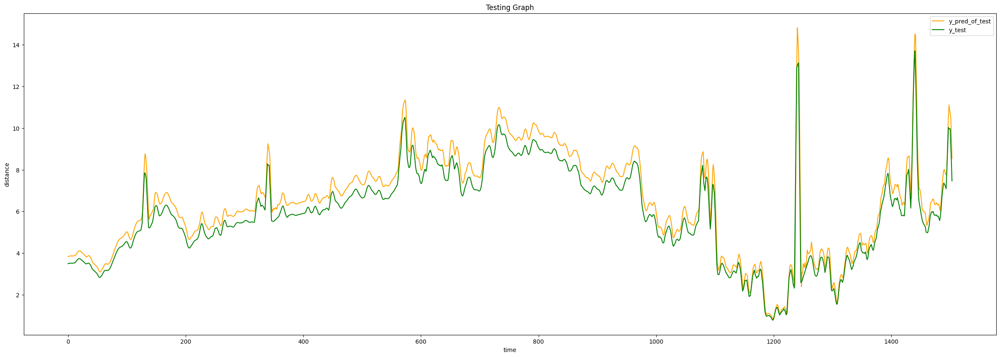


Prediction results:
r2_score:  0.9213560183702837
MAPE:  0.0955374554147427
MAE:  0.5558312957209919
RMSE:  0.599858354518449
_____________________________
Epoch 1/35
113/113 [==============================] - 9s 45ms/step - loss: 0.0030
Epoch 2/35
113/113 [==============================] - 5s 45ms/step - loss: 0.0022
Epoch 3/35
113/113 [==============================] - 5s 48ms/step - loss: 0.0018
Epoch 4/35
113/113 [==============================] - 6s 54ms/step - loss: 0.0013
Epoch 5/35
113/113 [==============================] - 6s 49ms/step - loss: 8.6316e-04
Epoch 6/35
113/113 [==============================] - 5s 47ms/step - loss: 6.8218e-04
Epoch 7/35
113/113 [==============================] - 5s 44ms/step - loss: 5.3501e-04
Epoch 8/35
113/113 [==============================] - 5s 47ms/step - loss: 4.9511e-04
Epoch 9/35
113/113 [==============================] - 5s 47ms/step - loss: 4.3957e-04
Epoch 10/35
113/113 [==============================] - 5s 44ms/step - loss: 4.2375e-0

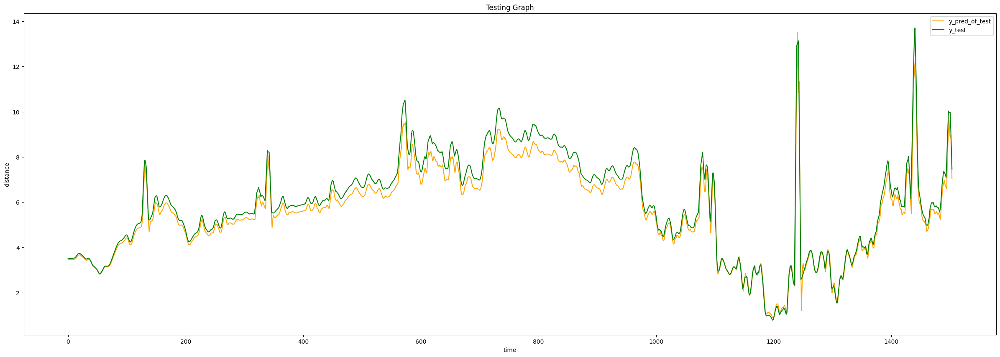


Prediction results:
r2_score:  0.9585325012073252
MAPE:  0.05377210829777202
MAE:  0.3483363947216197
RSME:  0.4355819608913507
['"HDFCBANK_ABB"', [0.9213560183702837, 0.599858354518449, 0.5558312957209919, 0.0955374554147427], [0.9585325012073252, 0.4355819608913507, 0.3483363947216197, 0.05377210829777202]]

***************************************************************************************************************
Pair Number: 13
Epoch 1/35
113/113 [==============================] - 5s 29ms/step - loss: 0.0810
Epoch 2/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0163
Epoch 3/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0065
Epoch 4/35
113/113 [==============================] - 4s 33ms/step - loss: 0.0041
Epoch 5/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0028
Epoch 6/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0022
Epoch 7/35
113/113 [==============================] - 3s 30ms/step 

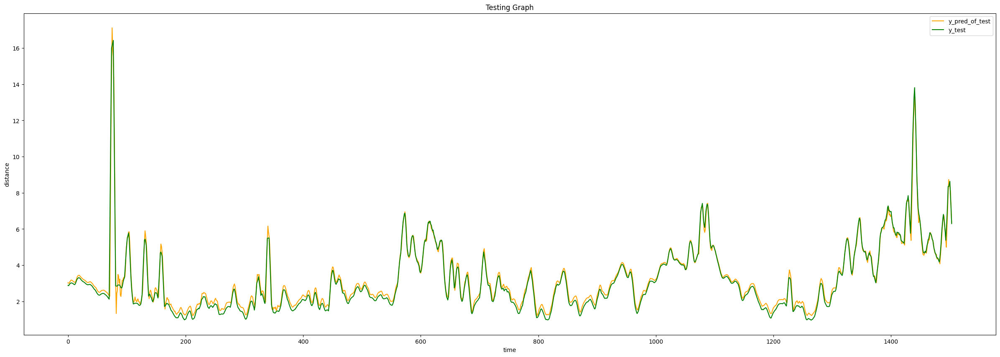


Prediction results:
r2_score:  0.982358062637046
MAPE:  0.0814463614080419
MAE:  0.18704672232533057
RMSE:  0.24548373196327464
_____________________________
Epoch 1/35
113/113 [==============================] - 8s 43ms/step - loss: 0.0042
Epoch 2/35
113/113 [==============================] - 5s 43ms/step - loss: 0.0028
Epoch 3/35
113/113 [==============================] - 5s 47ms/step - loss: 0.0021
Epoch 4/35
113/113 [==============================] - 5s 42ms/step - loss: 0.0017
Epoch 5/35
113/113 [==============================] - 5s 42ms/step - loss: 0.0012
Epoch 6/35
113/113 [==============================] - 5s 47ms/step - loss: 8.4341e-04
Epoch 7/35
113/113 [==============================] - 5s 47ms/step - loss: 0.0010
Epoch 8/35
113/113 [==============================] - 5s 43ms/step - loss: 5.8488e-04
Epoch 9/35
113/113 [==============================] - 5s 47ms/step - loss: 5.6839e-04
Epoch 10/35
113/113 [==============================] - 5s 42ms/step - loss: 5.1930e-04
Epoc

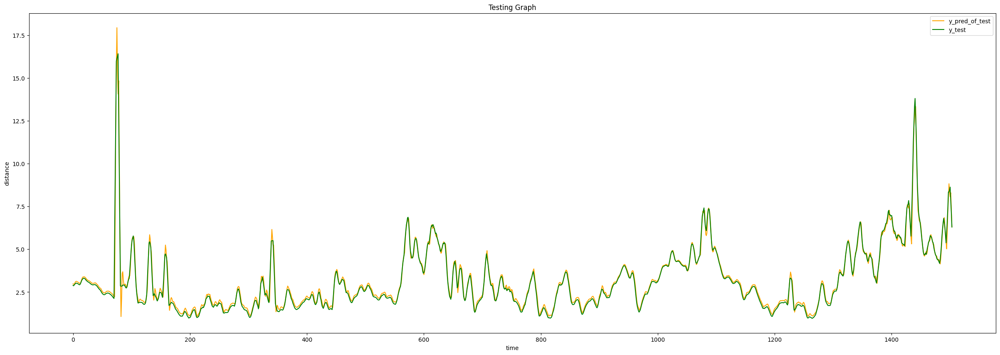


Prediction results:
r2_score:  0.9851730230911558
MAPE:  0.05466326915061246
MAE:  0.14055759366340492
RSME:  0.22504837672605518
['"HDFCBANK_TCS"', [0.982358062637046, 0.24548373196327464, 0.18704672232533057, 0.0814463614080419], [0.9851730230911558, 0.22504837672605518, 0.14055759366340492, 0.05466326915061246]]

***************************************************************************************************************
Pair Number: 14
Epoch 1/35
113/113 [==============================] - 6s 31ms/step - loss: 0.0794
Epoch 2/35
113/113 [==============================] - 4s 33ms/step - loss: 0.0165
Epoch 3/35
113/113 [==============================] - 4s 33ms/step - loss: 0.0068
Epoch 4/35
113/113 [==============================] - 3s 31ms/step - loss: 0.0044
Epoch 5/35
113/113 [==============================] - 3s 31ms/step - loss: 0.0031
Epoch 6/35
113/113 [==============================] - 4s 31ms/step - loss: 0.0025
Epoch 7/35
113/113 [==============================] - 4s 34ms

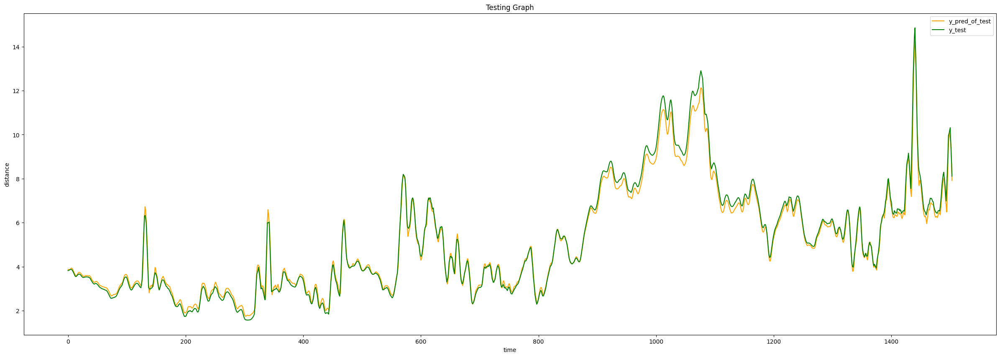


Prediction results:
r2_score:  0.9905699005469192
MAPE:  0.03608221149369388
MAE:  0.18116777372329204
RMSE:  0.24271691346802082
_____________________________
Epoch 1/35
113/113 [==============================] - 9s 50ms/step - loss: 0.0089
Epoch 2/35
113/113 [==============================] - 5s 45ms/step - loss: 0.0042
Epoch 3/35
113/113 [==============================] - 5s 44ms/step - loss: 0.0033
Epoch 4/35
113/113 [==============================] - 6s 49ms/step - loss: 0.0027
Epoch 5/35
113/113 [==============================] - 5s 48ms/step - loss: 0.0022
Epoch 6/35
113/113 [==============================] - 5s 45ms/step - loss: 0.0018
Epoch 7/35
113/113 [==============================] - 5s 49ms/step - loss: 0.0015
Epoch 8/35
113/113 [==============================] - 5s 45ms/step - loss: 0.0012
Epoch 9/35
113/113 [==============================] - 5s 44ms/step - loss: 9.4958e-04
Epoch 10/35
113/113 [==============================] - 6s 49ms/step - loss: 8.6752e-04
Epoch 11/3

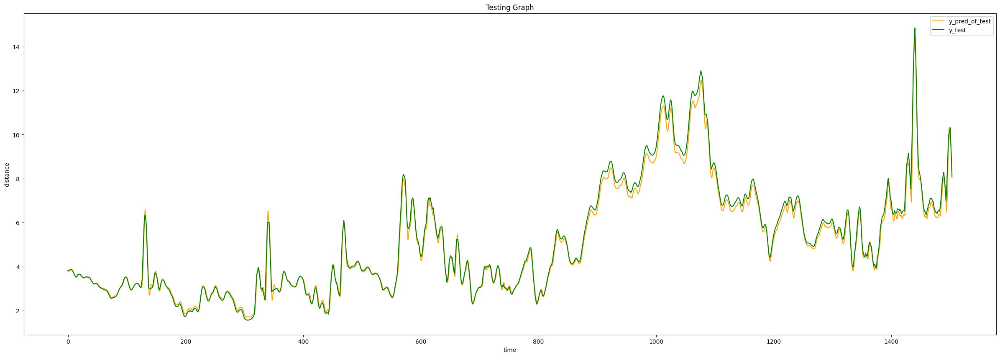


Prediction results:
r2_score:  0.9915775591204611
MAPE:  0.03084923610832124
MAE:  0.16782197009543226
RSME:  0.22938282118319167
['"HDFCBANK_INFY"', [0.9905699005469192, 0.24271691346802082, 0.18116777372329204, 0.03608221149369388], [0.9915775591204611, 0.22938282118319167, 0.16782197009543226, 0.03084923610832124]]

***************************************************************************************************************
Pair Number: 15
Epoch 1/35
113/113 [==============================] - 5s 30ms/step - loss: 0.1291
Epoch 2/35
113/113 [==============================] - 4s 33ms/step - loss: 0.0241
Epoch 3/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0107
Epoch 4/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0059
Epoch 5/35
113/113 [==============================] - 3s 30ms/step - loss: 0.0041
Epoch 6/35
113/113 [==============================] - 4s 32ms/step - loss: 0.0036
Epoch 7/35
113/113 [==============================] - 4s 3

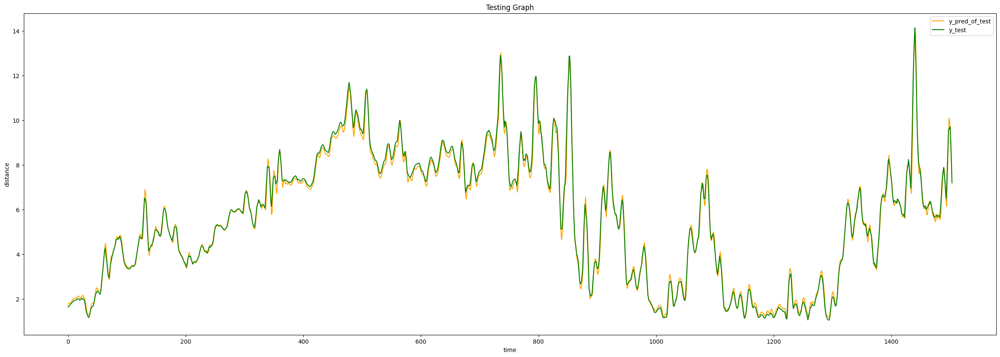


Prediction results:
r2_score:  0.9947782995879426
MAPE:  0.03358140211852397
MAE:  0.14982166992856652
RMSE:  0.20380260121578064
_____________________________
Epoch 1/35
113/113 [==============================] - 9s 48ms/step - loss: 0.0067
Epoch 2/35
113/113 [==============================] - 5s 47ms/step - loss: 0.0038
Epoch 3/35
113/113 [==============================] - 6s 51ms/step - loss: 0.0026
Epoch 4/35
113/113 [==============================] - 5s 47ms/step - loss: 0.0022
Epoch 5/35
113/113 [==============================] - 5s 47ms/step - loss: 0.0018
Epoch 6/35
113/113 [==============================] - 6s 51ms/step - loss: 0.0016
Epoch 7/35
113/113 [==============================] - 5s 48ms/step - loss: 0.0012
Epoch 8/35
113/113 [==============================] - 5s 47ms/step - loss: 0.0011
Epoch 9/35
113/113 [==============================] - 6s 51ms/step - loss: 8.3875e-04
Epoch 10/35
113/113 [==============================] - 5s 47ms/step - loss: 6.4052e-04
Epoch 11/3

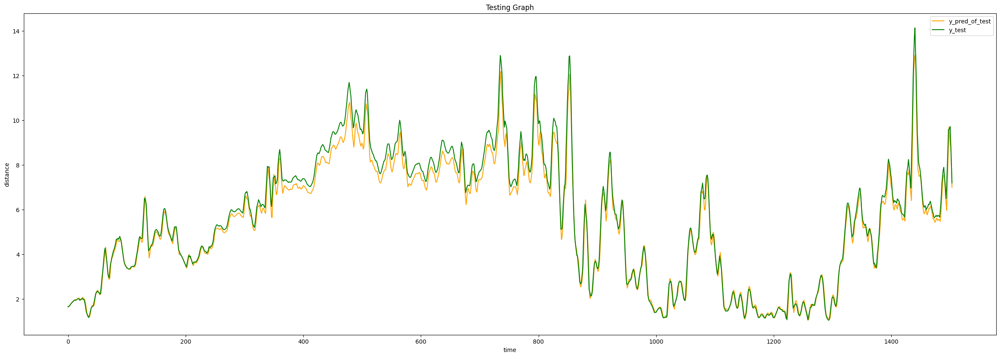


Prediction results:
r2_score:  0.982599345023208
MAPE:  0.046109411018506664
MAE:  0.2784230806403279
RSME:  0.3720373524571346
['"HDFCBANK_TATASTEEL"', [0.9947782995879426, 0.20380260121578064, 0.14982166992856652, 0.03358140211852397], [0.982599345023208, 0.3720373524571346, 0.2784230806403279, 0.046109411018506664]]

***************************************************************************************************************
Pair Number: 16
Epoch 1/35
113/113 [==============================] - 6s 30ms/step - loss: 0.0262
Epoch 2/35
113/113 [==============================] - 4s 32ms/step - loss: 0.0038
Epoch 3/35
113/113 [==============================] - 4s 32ms/step - loss: 0.0022
Epoch 4/35
113/113 [==============================] - 3s 31ms/step - loss: 0.0015
Epoch 5/35
113/113 [==============================] - 4s 31ms/step - loss: 0.0013
Epoch 6/35
113/113 [==============================] - 4s 31ms/step - loss: 8.9090e-04
Epoch 7/35
113/113 [==============================] -

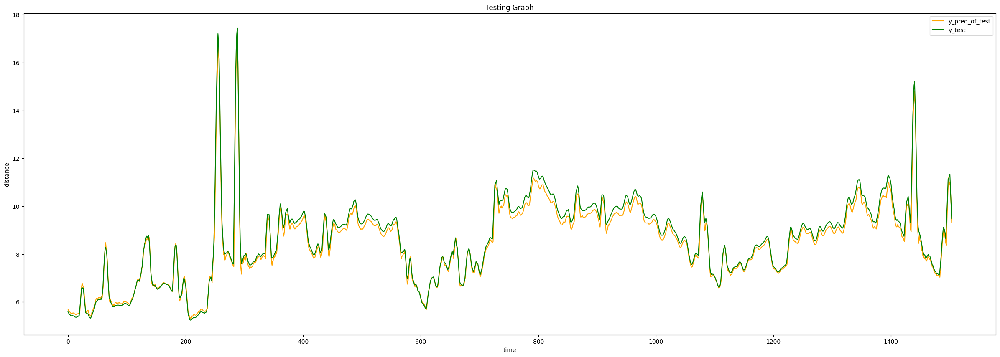


Prediction results:
r2_score:  0.9829828921944415
MAPE:  0.019431747070368956
MAE:  0.17808870437153268
RMSE:  0.22149295698752217
_____________________________
Epoch 1/35
113/113 [==============================] - 9s 48ms/step - loss: 0.0025
Epoch 2/35
113/113 [==============================] - 5s 44ms/step - loss: 0.0017
Epoch 3/35
113/113 [==============================] - 5s 44ms/step - loss: 0.0014
Epoch 4/35
113/113 [==============================] - 5s 47ms/step - loss: 0.0012
Epoch 5/35
113/113 [==============================] - 5s 45ms/step - loss: 9.1096e-04
Epoch 6/35
113/113 [==============================] - 5s 44ms/step - loss: 5.4586e-04
Epoch 7/35
113/113 [==============================] - 5s 46ms/step - loss: 4.3412e-04
Epoch 8/35
113/113 [==============================] - 5s 47ms/step - loss: 3.6988e-04
Epoch 9/35
113/113 [==============================] - 5s 44ms/step - loss: 4.0244e-04
Epoch 10/35
113/113 [==============================] - 5s 45ms/step - loss: 3.53

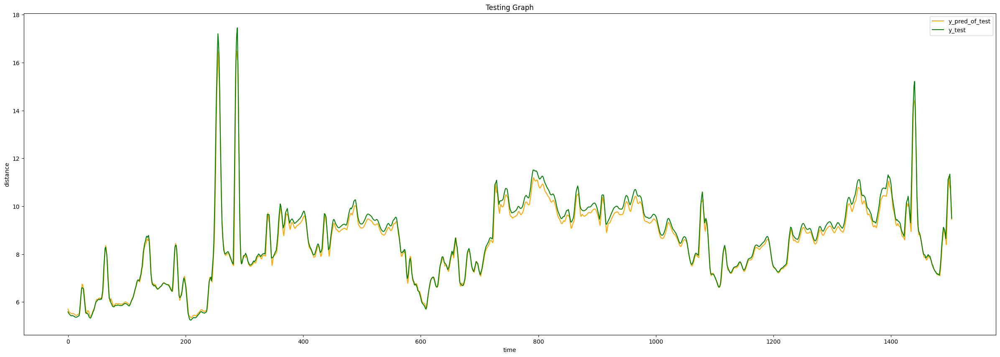


Prediction results:
r2_score:  0.9826145584651231
MAPE:  0.01800217611160087
MAE:  0.16600193827411525
RSME:  0.22387722157495007
['"HDFCBANK_SUNPHARMA"', [0.9829828921944415, 0.22149295698752217, 0.17808870437153268, 0.019431747070368956], [0.9826145584651231, 0.22387722157495007, 0.16600193827411525, 0.01800217611160087]]

***************************************************************************************************************
Pair Number: 17
Epoch 1/35
113/113 [==============================] - 6s 31ms/step - loss: 0.0751
Epoch 2/35
113/113 [==============================] - 4s 31ms/step - loss: 0.0091
Epoch 3/35
113/113 [==============================] - 4s 34ms/step - loss: 0.0051
Epoch 4/35
113/113 [==============================] - 4s 31ms/step - loss: 0.0034
Epoch 5/35
113/113 [==============================] - 4s 31ms/step - loss: 0.0023
Epoch 6/35
113/113 [==============================] - 4s 31ms/step - loss: 0.0020
Epoch 7/35
113/113 [==============================] 

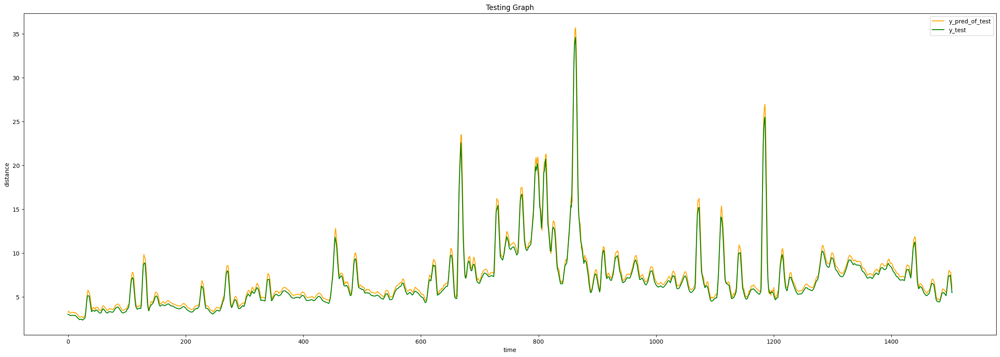


Prediction results:
r2_score:  0.9779134740489489
MAPE:  0.0654907901470393
MAE:  0.4320839307900218
RMSE:  0.5330156786823546
_____________________________
Epoch 1/35
113/113 [==============================] - 11s 61ms/step - loss: 0.0043
Epoch 2/35
113/113 [==============================] - 6s 57ms/step - loss: 0.0030
Epoch 3/35
113/113 [==============================] - 7s 62ms/step - loss: 0.0021
Epoch 4/35
113/113 [==============================] - 7s 58ms/step - loss: 0.0015
Epoch 5/35
113/113 [==============================] - 7s 59ms/step - loss: 0.0011
Epoch 6/35
113/113 [==============================] - 7s 59ms/step - loss: 8.7454e-04
Epoch 7/35
113/113 [==============================] - 6s 57ms/step - loss: 7.5590e-04
Epoch 8/35
113/113 [==============================] - 7s 62ms/step - loss: 6.2516e-04
Epoch 9/35
113/113 [==============================] - 6s 57ms/step - loss: 5.8743e-04
Epoch 10/35
113/113 [==============================] - 7s 61ms/step - loss: 5.7471e-04


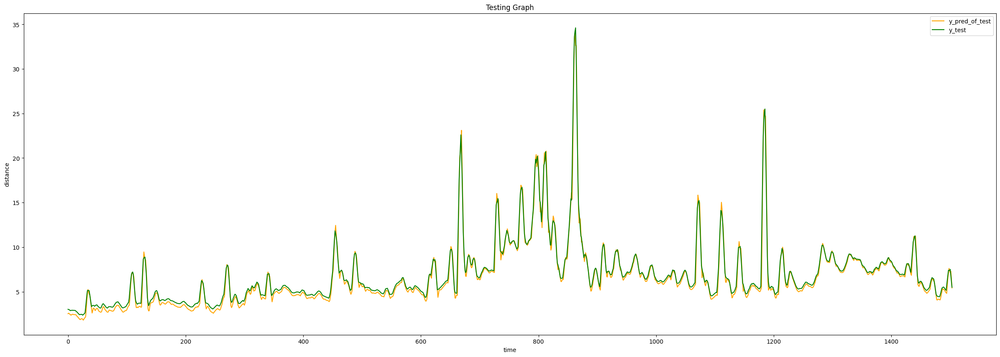


Prediction results:
r2_score:  0.9832503425502457
MAPE:  0.05765804629911652
MAE:  0.34226159341657836
RSME:  0.46417232563836286
['"HDFCBANK_CONCOR"', [0.9779134740489489, 0.5330156786823546, 0.4320839307900218, 0.0654907901470393], [0.9832503425502457, 0.46417232563836286, 0.34226159341657836, 0.05765804629911652]]

***************************************************************************************************************
Pair Number: 18
Epoch 1/35
113/113 [==============================] - 7s 35ms/step - loss: 0.1436
Epoch 2/35
113/113 [==============================] - 4s 36ms/step - loss: 0.0237
Epoch 3/35
113/113 [==============================] - 4s 36ms/step - loss: 0.0096
Epoch 4/35
113/113 [==============================] - 4s 39ms/step - loss: 0.0056
Epoch 5/35
113/113 [==============================] - 4s 36ms/step - loss: 0.0041
Epoch 6/35
113/113 [==============================] - 4s 38ms/step - loss: 0.0032
Epoch 7/35
113/113 [==============================] - 4s 38

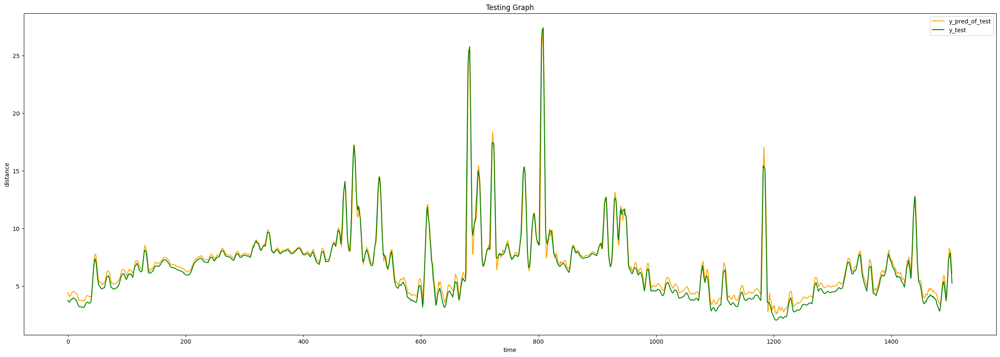


Prediction results:
r2_score:  0.9708026482341059
MAPE:  0.07380119069405218
MAE:  0.3948311091918801
RMSE:  0.5251578526753673
_____________________________
Epoch 1/35
113/113 [==============================] - 11s 60ms/step - loss: 0.0032
Epoch 2/35
113/113 [==============================] - 6s 57ms/step - loss: 0.0025
Epoch 3/35
113/113 [==============================] - 6s 57ms/step - loss: 0.0019
Epoch 4/35
113/113 [==============================] - 7s 60ms/step - loss: 0.0015
Epoch 5/35
113/113 [==============================] - 6s 56ms/step - loss: 0.0011
Epoch 6/35
113/113 [==============================] - 7s 60ms/step - loss: 8.3156e-04
Epoch 7/35
113/113 [==============================] - 6s 57ms/step - loss: 6.9080e-04
Epoch 8/35
113/113 [==============================] - 7s 58ms/step - loss: 5.1421e-04
Epoch 9/35
113/113 [==============================] - 7s 59ms/step - loss: 4.4783e-04
Epoch 10/35
113/113 [==============================] - 6s 56ms/step - loss: 4.1556e-04

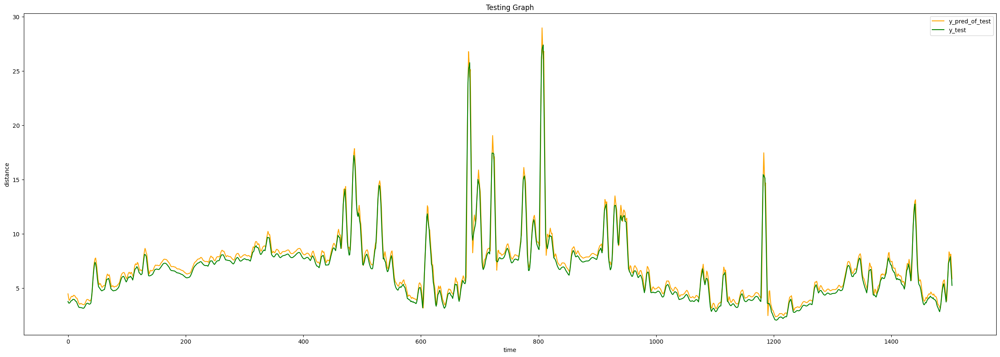


Prediction results:
r2_score:  0.9705623050749637
MAPE:  0.06904681960757748
MAE:  0.4211145391943851
RSME:  0.5273148875896155
['"HDFCBANK_BHARTIARTL"', [0.9708026482341059, 0.5251578526753673, 0.3948311091918801, 0.07380119069405218], [0.9705623050749637, 0.5273148875896155, 0.4211145391943851, 0.06904681960757748]]

***************************************************************************************************************
Pair Number: 19
Epoch 1/35
113/113 [==============================] - 6s 34ms/step - loss: 0.0642
Epoch 2/35
113/113 [==============================] - 4s 37ms/step - loss: 0.0094
Epoch 3/35
113/113 [==============================] - 4s 33ms/step - loss: 0.0052
Epoch 4/35
113/113 [==============================] - 4s 33ms/step - loss: 0.0026
Epoch 5/35
113/113 [==============================] - 4s 33ms/step - loss: 0.0021
Epoch 6/35
113/113 [==============================] - 4s 36ms/step - loss: 0.0016
Epoch 7/35
113/113 [==============================] - 4s 3

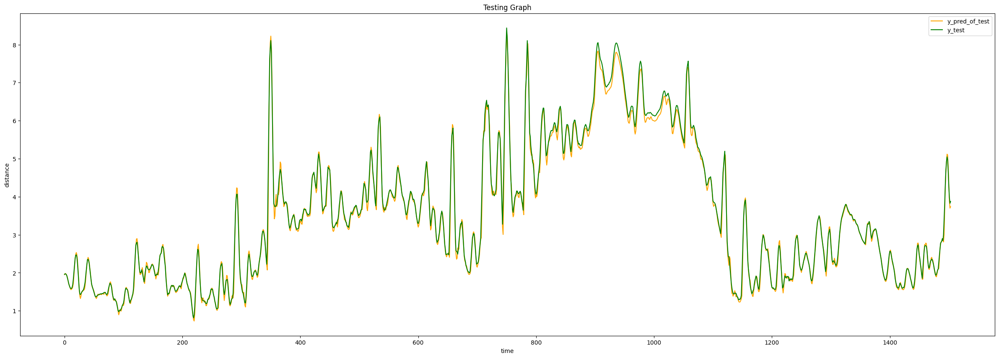


Prediction results:
r2_score:  0.9952428839049017
MAPE:  0.024104232284842167
MAE:  0.08202365215494686
RMSE:  0.12300994526621478
_____________________________
Epoch 1/35
113/113 [==============================] - 11s 53ms/step - loss: 0.0026
Epoch 2/35
113/113 [==============================] - 5s 46ms/step - loss: 0.0025
Epoch 3/35
113/113 [==============================] - 5s 47ms/step - loss: 0.0022
Epoch 4/35
113/113 [==============================] - 6s 51ms/step - loss: 0.0018
Epoch 5/35
113/113 [==============================] - 6s 53ms/step - loss: 0.0016
Epoch 6/35
113/113 [==============================] - 7s 62ms/step - loss: 0.0014
Epoch 7/35
113/113 [==============================] - 7s 64ms/step - loss: 0.0011
Epoch 8/35
113/113 [==============================] - 6s 53ms/step - loss: 9.2600e-04
Epoch 9/35
113/113 [==============================] - 6s 55ms/step - loss: 6.5093e-04
Epoch 10/35
113/113 [==============================] - 5s 47ms/step - loss: 5.4445e-04
Epoc

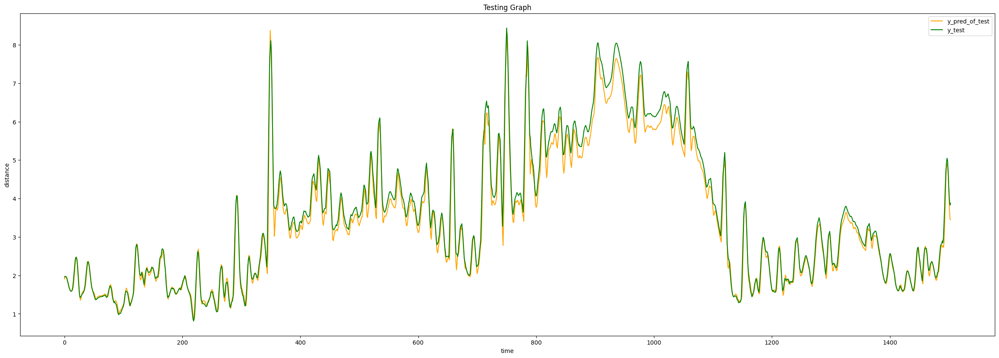


Prediction results:
r2_score:  0.9835341389815987
MAPE:  0.04526814601984922
MAE:  0.17141476680373413
RSME:  0.22885508827480455
['"M&M_ULTRACEMCO"', [0.9952428839049017, 0.12300994526621478, 0.08202365215494686, 0.024104232284842167], [0.9835341389815987, 0.22885508827480455, 0.17141476680373413, 0.04526814601984922]]

***************************************************************************************************************
Pair Number: 20
Epoch 1/35
113/113 [==============================] - 5s 24ms/step - loss: 0.1676
Epoch 2/35
113/113 [==============================] - 3s 24ms/step - loss: 0.0165
Epoch 3/35
113/113 [==============================] - 3s 25ms/step - loss: 0.0080
Epoch 4/35
113/113 [==============================] - 3s 28ms/step - loss: 0.0050
Epoch 5/35
113/113 [==============================] - 3s 25ms/step - loss: 0.0036
Epoch 6/35
113/113 [==============================] - 3s 28ms/step - loss: 0.0029
Epoch 7/35
113/113 [==============================] - 3s

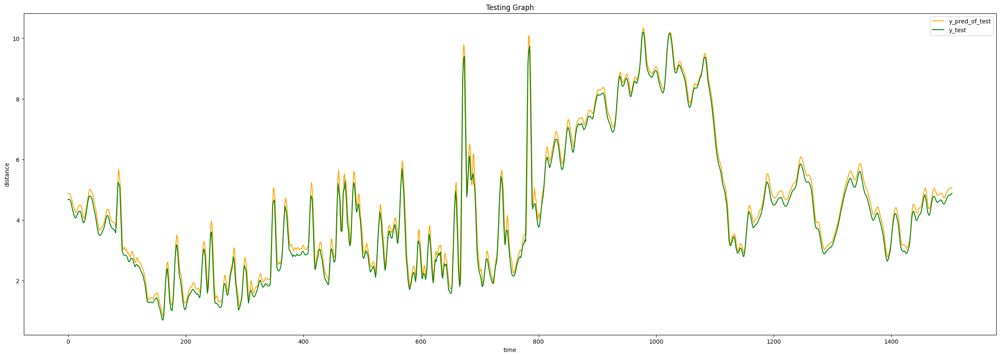


Prediction results:
r2_score:  0.9870416133544678
MAPE:  0.06399570562033759
MAE:  0.21261303231301593
RMSE:  0.25191007950267635
_____________________________
Epoch 1/35
113/113 [==============================] - 11s 59ms/step - loss: 0.0044
Epoch 2/35
113/113 [==============================] - 7s 64ms/step - loss: 0.0028
Epoch 3/35
113/113 [==============================] - 7s 60ms/step - loss: 0.0024
Epoch 4/35
113/113 [==============================] - 7s 58ms/step - loss: 0.0019
Epoch 5/35
113/113 [==============================] - 7s 60ms/step - loss: 0.0015
Epoch 6/35
113/113 [==============================] - 7s 60ms/step - loss: 0.0012
Epoch 7/35
113/113 [==============================] - 6s 57ms/step - loss: 9.6708e-04
Epoch 8/35
113/113 [==============================] - 7s 59ms/step - loss: 7.2407e-04
Epoch 9/35
113/113 [==============================] - 6s 57ms/step - loss: 5.8978e-04
Epoch 10/35
113/113 [==============================] - 6s 50ms/step - loss: 6.1275e-04
E

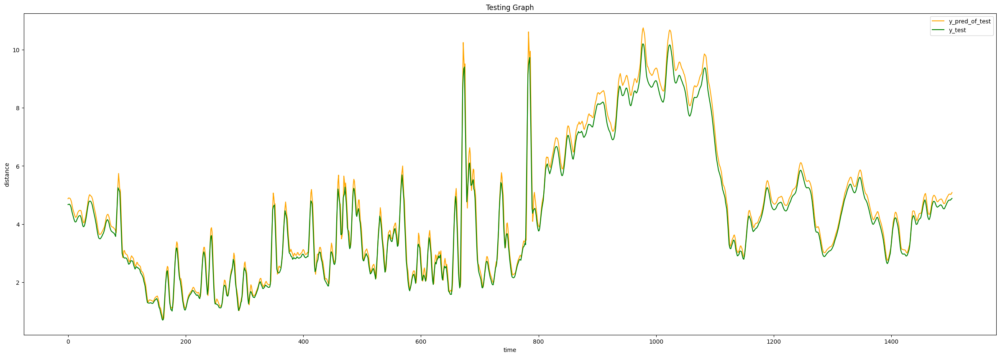


Prediction results:
r2_score:  0.9853804053380447
MAPE:  0.05454703497907867
MAE:  0.22081061257452422
RSME:  0.2675702003194314
['"M&M_GRASIM"', [0.9870416133544678, 0.25191007950267635, 0.21261303231301593, 0.06399570562033759], [0.9853804053380447, 0.2675702003194314, 0.22081061257452422, 0.05454703497907867]]

***************************************************************************************************************
Pair Number: 21
Epoch 1/35
113/113 [==============================] - 6s 33ms/step - loss: 0.1024
Epoch 2/35
113/113 [==============================] - 4s 34ms/step - loss: 0.0171
Epoch 3/35
113/113 [==============================] - 3s 31ms/step - loss: 0.0088
Epoch 4/35
113/113 [==============================] - 3s 31ms/step - loss: 0.0057
Epoch 5/35
113/113 [==============================] - 4s 35ms/step - loss: 0.0040
Epoch 6/35
113/113 [==============================] - 5s 40ms/step - loss: 0.0037
Epoch 7/35
113/113 [==============================] - 4s 39ms/s

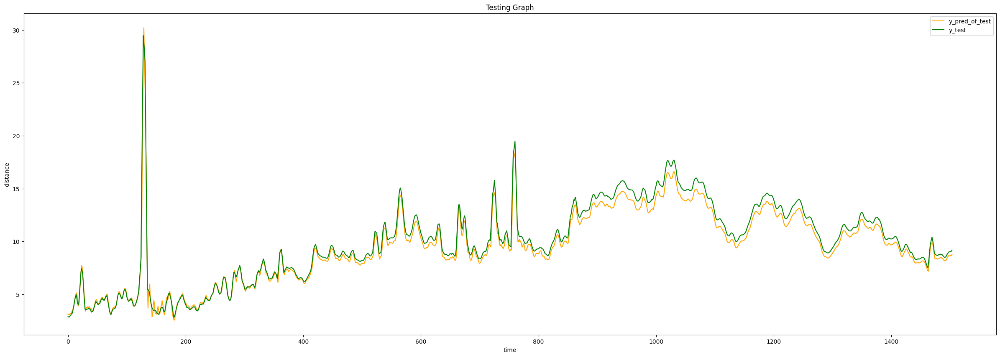


Prediction results:
r2_score:  0.9739187225233894
MAPE:  0.04699417027208298
MAE:  0.49665992314077934
RMSE:  0.6010149010891904
_____________________________
Epoch 1/35
113/113 [==============================] - 11s 49ms/step - loss: 0.0086
Epoch 2/35
113/113 [==============================] - 5s 45ms/step - loss: 0.0064
Epoch 3/35
113/113 [==============================] - 5s 49ms/step - loss: 0.0054
Epoch 4/35
113/113 [==============================] - 7s 61ms/step - loss: 0.0044
Epoch 5/35
113/113 [==============================] - 7s 65ms/step - loss: 0.0040
Epoch 6/35
113/113 [==============================] - 8s 75ms/step - loss: 0.0032
Epoch 7/35
113/113 [==============================] - 9s 80ms/step - loss: 0.0027
Epoch 8/35
113/113 [==============================] - 10s 85ms/step - loss: 0.0023
Epoch 9/35
113/113 [==============================] - 11s 97ms/step - loss: 0.0018
Epoch 10/35
113/113 [==============================] - 11s 100ms/step - loss: 0.0014
Epoch 11/35
11

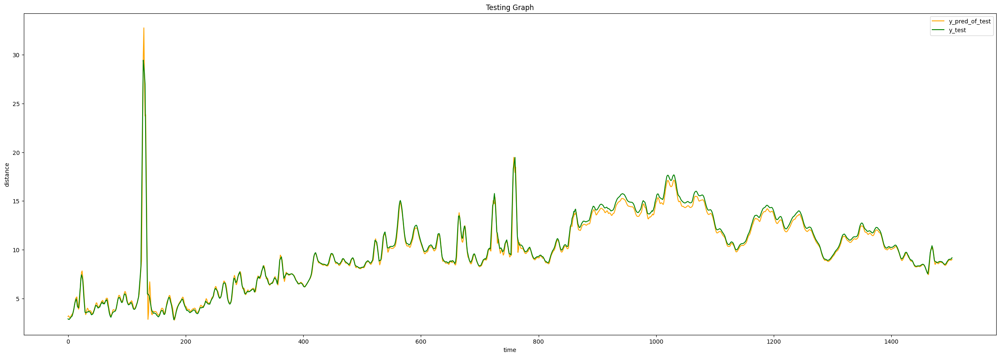


Prediction results:
r2_score:  0.9890922798721227
MAPE:  0.025790887395180026
MAE:  0.25073298050819476
RSME:  0.38867607016395467
['"M&M_PIDILITIND"', [0.9739187225233894, 0.6010149010891904, 0.49665992314077934, 0.04699417027208298], [0.9890922798721227, 0.38867607016395467, 0.25073298050819476, 0.025790887395180026]]

***************************************************************************************************************
Pair Number: 22
Epoch 1/35
113/113 [==============================] - 5s 26ms/step - loss: 0.1412
Epoch 2/35
113/113 [==============================] - 3s 29ms/step - loss: 0.0226
Epoch 3/35
113/113 [==============================] - 3s 28ms/step - loss: 0.0120
Epoch 4/35
113/113 [==============================] - 3s 28ms/step - loss: 0.0073
Epoch 5/35
113/113 [==============================] - 3s 27ms/step - loss: 0.0049
Epoch 6/35
113/113 [==============================] - 3s 28ms/step - loss: 0.0044
Epoch 7/35
113/113 [==============================] - 3s

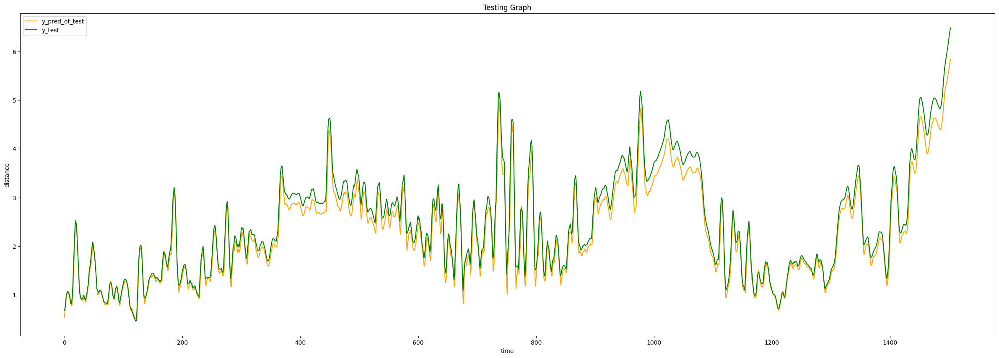


Prediction results:
r2_score:  0.9619645183467791
MAPE:  0.06496835744348897
MAE:  0.16924315058361522
RMSE:  0.20881708438840876
_____________________________
Epoch 1/35
113/113 [==============================] - 10s 53ms/step - loss: 0.0078
Epoch 2/35
113/113 [==============================] - 5s 48ms/step - loss: 0.0071
Epoch 3/35
113/113 [==============================] - 5s 48ms/step - loss: 0.0047
Epoch 4/35
113/113 [==============================] - 6s 52ms/step - loss: 0.0036
Epoch 5/35
113/113 [==============================] - 5s 48ms/step - loss: 0.0029
Epoch 6/35
113/113 [==============================] - 5s 47ms/step - loss: 0.0027
Epoch 7/35
113/113 [==============================] - 6s 52ms/step - loss: 0.0021
Epoch 8/35
113/113 [==============================] - 5s 47ms/step - loss: 0.0019
Epoch 9/35
113/113 [==============================] - 7s 61ms/step - loss: 0.0016
Epoch 10/35
113/113 [==============================] - 6s 52ms/step - loss: 0.0013
Epoch 11/35
113/1

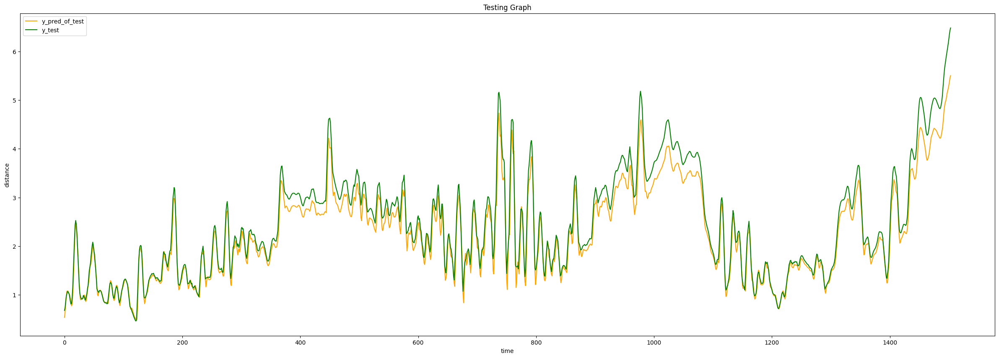


Prediction results:
r2_score:  0.9432263277765532
MAPE:  0.06982560206434835
MAE:  0.19412611742416758
RSME:  0.25512032563191345
['"M&M_LT"', [0.9619645183467791, 0.20881708438840876, 0.16924315058361522, 0.06496835744348897], [0.9432263277765532, 0.25512032563191345, 0.19412611742416758, 0.06982560206434835]]

***************************************************************************************************************
Pair Number: 23
Epoch 1/35
113/113 [==============================] - 6s 36ms/step - loss: 0.1375
Epoch 2/35
113/113 [==============================] - 4s 33ms/step - loss: 0.0298
Epoch 3/35
113/113 [==============================] - 4s 37ms/step - loss: 0.0124
Epoch 4/35
113/113 [==============================] - 4s 37ms/step - loss: 0.0072
Epoch 5/35
113/113 [==============================] - 5s 40ms/step - loss: 0.0055
Epoch 6/35
113/113 [==============================] - 4s 37ms/step - loss: 0.0042
Epoch 7/35
113/113 [==============================] - 4s 35ms/ste

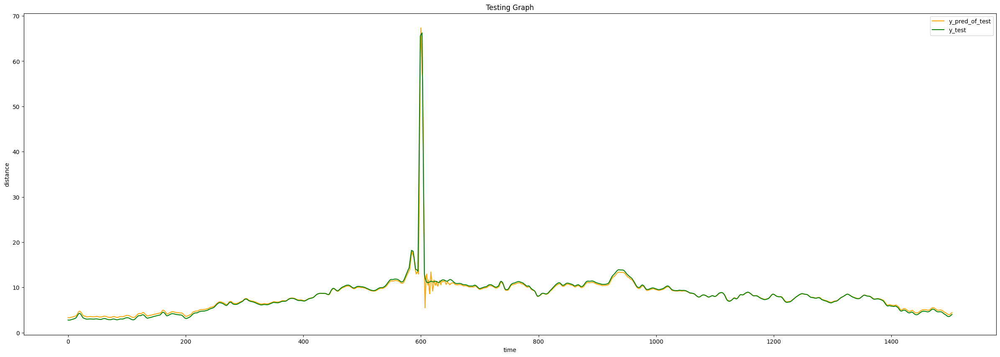


Prediction results:
r2_score:  0.9790862501924417
MAPE:  0.0433757800727334
MAE:  0.2835531561086146
RMSE:  0.6685931851293937
_____________________________
Epoch 1/35
113/113 [==============================] - 12s 55ms/step - loss: 0.0086
Epoch 2/35
113/113 [==============================] - 5s 45ms/step - loss: 0.0065
Epoch 3/35
113/113 [==============================] - 5s 47ms/step - loss: 0.0050
Epoch 4/35
113/113 [==============================] - 5s 45ms/step - loss: 0.0040
Epoch 5/35
113/113 [==============================] - 5s 45ms/step - loss: 0.0032
Epoch 6/35
113/113 [==============================] - 5s 49ms/step - loss: 0.0026
Epoch 7/35
113/113 [==============================] - 5s 44ms/step - loss: 0.0021
Epoch 8/35
113/113 [==============================] - 6s 54ms/step - loss: 0.0018
Epoch 9/35
113/113 [==============================] - 7s 63ms/step - loss: 0.0014
Epoch 10/35
113/113 [==============================] - 7s 60ms/step - loss: 0.0011
Epoch 11/35
113/113 

In [ ]:
rows = []
count = 0
for file in names:
    print("\n***************************************************************************************************************")
    print("Pair Number:", count)
    count+=1
    train_data = train_data_file[file]
    test_data = test_data_file[file]
    length_validation = len(test_data)
    length_train = len(train_data)

    train = np.array(train_data)
    dataset_train = train
    dataset_train = train.reshape(-1,1)
    
    scaler = MinMaxScaler(feature_range = (0,1))
    
    # scaling dataset
    dataset_train_scaled = scaler.fit_transform(dataset_train)
    
    X_train = []
    y_train = []
    
    time_step = 50
    
    for i in range(time_step, length_train):
        X_train.append(dataset_train_scaled[i-time_step:i,0])
        y_train.append(dataset_train_scaled[i,0])
        
    # convert list to array
    X_train, y_train = np.array(X_train), np.array(y_train)
    
    
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1))
    y_train = np.reshape(y_train, (y_train.shape[0],1))
    
    
    # initializing the RNN
    regressor = Sequential()
    
    # adding first RNN layer and dropout regulatization
    regressor.add(SimpleRNN(units = 50, activation = "tanh", return_sequences = True, input_shape = (X_train.shape[1],1)))
    
    regressor.add(Dropout(0.2))
    
    # # adding third RNN layer and dropout regulatization
    
    regressor.add(SimpleRNN(units = 50, activation = "tanh", return_sequences = True))
    
    regressor.add(Dropout(0.2))
    
    # adding fourth RNN layer and dropout regulatization
    
    regressor.add(SimpleRNN(units = 50))
    
    regressor.add(Dropout(0.2))
    
    # adding the output layer
    regressor.add(Dense(units = 1))
    
    # # compiling RNN
    regressor.compile(
        optimizer = "adam", 
        loss = "mean_squared_error")
    
    # fitting the RNN
    history = regressor.fit(X_train, y_train, epochs = 35, batch_size = 32, shuffle = False)

    y_train = scaler.inverse_transform(y_train) # scaling back from 0-1 to original
    y_pred = regressor.predict(X_train)  # predictions
    y_pred = scaler.inverse_transform(y_pred) # scaling back from 0-1 to original

    
    validation_data = np.array(test_data)
    dataset_validation = validation_data  # getting "open" column and converting to array
    dataset_validation = np.reshape(dataset_validation, (-1,1))  # converting 1D to 2D array
    scaled_dataset_validation =  scaler.fit_transform(dataset_validation)  # scaling open values to between 0 and 1
    
    # Creating X_test and y_test
    X_test = []
    y_test = []
    
    for i in range(time_step, length_validation):
        X_test.append(scaled_dataset_validation[i-time_step:i,0])
        y_test.append(scaled_dataset_validation[i,0])
    
    # Converting to array
    X_test, y_test = np.array(X_test), np.array(y_test)
    
    X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))  # reshape to 3D array
    y_test = np.reshape(y_test, (-1,1))  # reshape to 2D array
     
    # predictions with X_test data
    y_pred_of_test = regressor.predict(X_test)
    # scaling back from 0-1 to original
    y_pred_of_test = scaler.inverse_transform(y_pred_of_test) 
    flattened_results = np.array(y_pred_of_test).flatten().tolist()
    predicted_series_rnn[names.index(file)] = flattened_results
    # visualisation
    plt.figure(figsize = (30,10))
    plt.plot(y_pred_of_test, label = "y_pred_of_test", c = "orange")
    plt.plot(scaler.inverse_transform(y_test) , label = "y_test", c = "g")
    plt.xlabel("time")
    plt.ylabel("distance")
    plt.title("Testing Graph")
    plt.legend()
    plt.show()
    
    R2score = r2_score(scaler.inverse_transform(y_test), y_pred_of_test)
    rsme = np.sqrt(mean_squared_error(scaler.inverse_transform(y_test), y_pred_of_test))
    mape = mean_absolute_percentage_error(scaler.inverse_transform(y_test), y_pred_of_test)
    mae = mean_absolute_error(scaler.inverse_transform(y_test), y_pred_of_test)
    print("\nPrediction results:")
    results_rnn = [R2score, rsme, mae, mape]
    y = scaler.inverse_transform(y_test)
    # thresholds = [epsilon1[names.index(file)],epsilon2[names.index(file)],epsilon3[names.index(file)],epsilon4[names.index(file)]]
    
    print("r2_score: ", R2score)
    print("MAPE: ", mape)
    print("MAE: ", mae)
    print("RMSE: ", rsme)
   
    print("_____________________________")
    
    
    ###LSTM#####
    
    train_data = train_data_file[file]
    test_data = test_data_file[file]
    length_validation = len(test_data)
    length_train = len(train_data)
    
    train = np.array(train_data)
    dataset_train = train
    dataset_train = train.reshape(-1,1)
    
    scaler = MinMaxScaler(feature_range = (0,1))
    
    # scaling dataset
    dataset_train_scaled = scaler.fit_transform(dataset_train)
    
    X_train = []
    y_train = []
    
    time_step = 50
    
    for i in range(time_step, length_train):
        X_train.append(dataset_train_scaled[i-time_step:i,0])
        y_train.append(dataset_train_scaled[i,0])
        
    # convert list to array
    X_train, y_train = np.array(X_train), np.array(y_train)
    
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1))
    y_train = np.reshape(y_train, (y_train.shape[0],1))
    
    #Initialise LSTM
    regressor = Sequential()
    
    regressor.add(LSTM(units = 50, activation = "tanh", return_sequences = True, input_shape = (X_train.shape[1],1)))
    regressor.add(Dropout(0.2))
    
    regressor.add(LSTM(units = 50, activation = "tanh"))
    regressor.add(Dropout(0.2))
    
    regressor.add(Dense(units = 1))
    
    # # compiling RNN
    regressor.compile(
        optimizer = "adam", 
        loss = "mean_squared_error")
    
    # fitting the RNN
    history = regressor.fit(X_train, y_train, epochs = 35, batch_size = 32, shuffle = False)
    
    y_train = scaler.inverse_transform(y_train) # scaling back from 0-1 to original
    y_pred = regressor.predict(X_train)  # predictions
    y_pred = scaler.inverse_transform(y_pred) # scaling back from 0-1 to original
    
    validation_data = np.array(test_data)
    dataset_validation = validation_data  # getting "open" column and converting to array
    dataset_validation = np.reshape(dataset_validation, (-1,1))  # converting 1D to 2D array
    scaled_dataset_validation =  scaler.fit_transform(dataset_validation)  # scaling open values to between 0 and 1
    
    # Creating X_test and y_test
    X_test = []
    y_test = []
    
    for i in range(time_step, length_validation):
        X_test.append(scaled_dataset_validation[i-time_step:i,0])
        y_test.append(scaled_dataset_validation[i,0])
    
    # Converting to array
    X_test, y_test = np.array(X_test), np.array(y_test)

    
    X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))  # reshape to 3D array
    y_test = np.reshape(y_test, (-1,1))  # reshape to 2D array
    
    
    # predictions with X_test data
    y_pred_of_test = regressor.predict(X_test)
    # scaling back from 0-1 to original
    y_pred_of_test = scaler.inverse_transform(y_pred_of_test) 
    flattened_results = np.array(y_pred_of_test).flatten().tolist()
    predicted_series_lstm[names.index(file)] = flattened_results
    # visualisation
    plt.figure(figsize = (30,10))
    plt.plot(y_pred_of_test, label = "y_pred_of_test", c = "orange")
    plt.plot(scaler.inverse_transform(y_test), label = "y_test", c = "green")
    plt.xlabel("time")
    plt.ylabel("distance")
    plt.title("Testing Graph")
    plt.legend()
    plt.show()
    
    R2score = r2_score(scaler.inverse_transform(y_test), y_pred_of_test)
    rsme = np.sqrt(mean_squared_error(scaler.inverse_transform(y_test), y_pred_of_test))
    mape = mean_absolute_percentage_error(scaler.inverse_transform(y_test), y_pred_of_test)
    mae = mean_absolute_error(scaler.inverse_transform(y_test), y_pred_of_test)
    print("\nPrediction results:")
    
    results_lstm = [R2score, rsme, mae, mape]
    y = scaler.inverse_transform(y_test)
    # thresholds = [epsilon1[names.index(file)],epsilon2[names.index(file)],epsilon3[names.index(file)],epsilon4[names.index(file)]]
    
    
    print("r2_score: ", R2score)
    print("MAPE: ", mape)
    print("MAE: ", mae)
    print("RSME: ", rsme)

    final_results = [file]
    final_results.append(results_rnn)
    final_results.append(results_lstm)
    print(final_results)
    rows.append(final_results)

In [ ]:
# Version number (increment manually if needed)
version = 1

# Save the RNN results with the version number
df = pd.DataFrame(predicted_series_rnn)
df.columns = names
df.to_csv(f"predicted_series_rnn_block10_w50_v{version}.csv")

# Save the LSTM results with the version number
df = pd.DataFrame(predicted_series_lstm)
df.columns = names
df.to_csv(f"predicted_series_lstm_block10_w50_v{version}.csv")


In [ ]:
rnn_r2 = []
rnn_rmse = []
rnn_mae = []
rnn_mape = []
lstm_r2 = []
lstm_rmse = []
lstm_mae = []
lstm_mape = []

results_rows = []
for i in range (len(rows)):
    row = rows[i]
    rnn = row[1]
    rnn_r2.append(rnn[0])
    rnn_rmse.append(rnn[1])
    rnn_mae.append(rnn[2])
    rnn_mape.append(rnn[3])
    
    lstm = row[2]
    
    lstm_r2.append(lstm[0])
    lstm_rmse.append(lstm[1])
    lstm_mae.append(lstm[2])
    lstm_mape.append(lstm[3])
    
results_rows = [rnn_r2,rnn_rmse,rnn_mae,
                 
                lstm_r2,lstm_rmse,lstm_mae,]

In [ ]:
high_acc = []
good = []
mid = []
bad = []
for i in range(len(rnn_mape)):
    if lstm_mape[i]<=0.10:
        high_acc.append(lstm_mape[i])
    elif lstm_mape[i]<=0.20 and lstm_mape[i]>0.10:
        good.append(lstm_mape[i])
    elif lstm_mape[i]<=0.50 and lstm_mape[i]>0.20:
        mid.append(lstm_mape[i])
    elif lstm_mape[i]>0.50:
        bad.append(lstm_mape[i])

In [ ]:
print(len(rnn_mape))
print(len(lstm_mape))

In [ ]:
from statistics import mean 

print("Highly accuracte MAPE count: ", len(high_acc), "-> avg = ",mean(high_acc))
print("Good accuracte MAPE count: ", len(good),"-> avg = ",mean(good))
print("Reasonably good accuracte MAPE count: ", len(mid), "-> avg = ",mean(mid))
print("Inaccuracte MAPE count: ", len(bad))

In [ ]:
high_acc = []
good = []
mid = []
bad = []
for i in range(len(rnn_mape)):
    if rnn_mape[i]<=0.10:
        high_acc.append(rnn_mape[i])
    elif rnn_mape[i]<=0.20 and rnn_mape[i]>0.10:
        good.append(rnn_mape[i])
    elif rnn_mape[i]<=0.50 and rnn_mape[i]>0.20:
        mid.append(rnn_mape[i])
    elif rnn_mape[i]>0.50:
        bad.append(rnn_mape[i])

In [ ]:
from statistics import mean 

print("Highly accuracte MAPE count: ", len(high_acc), "-> avg = ",mean(high_acc))
print("Good accuracte MAPE count: ", len(good),"-> avg = ",mean(good))
print("Reasonably good accuracte MAPE count: ", len(mid), "-> avg = ",mean(mid))
print("Inaccuracte MAPE count: ", len(bad))

In [ ]:
fields = ['Name', 'RNN results', 'LSTM results']
filename = 'PriceVolBlock_Results_block10_w50_v1.csv'
#RNN, LSTM Results look like: [[r2score, rsme, mae, accuracy1, f1_1, f1_indiv[0]_1,f1_indiv[1]_1, y_a.count(0), y_a.count(1)],..]
with open(filename, 'w') as csvfile:
    # creating a csv writer object
    csvwriter = csv.writer(csvfile)
 
    # writing the fields
    csvwriter.writerow(fields)
 
    # writing the data rows
    csvwriter.writerows(rows)

In [ ]:
print(len(rows))

In [ ]:
rnn_r2 = []
rnn_rmse = []
rnn_mae = []
rnn_mape = []

rnn_f1_1_e1 = []
rnn_f1_e1 = []
rnn_acc_e1 = []
rnn_per_e1 = []

rnn_f1_1_e2 = []
rnn_f1_e2 = []
rnn_acc_e2 = []
rnn_per_e2 = []

rnn_f1_1_e3 = []
rnn_f1_e3 = []
rnn_acc_e3 = []
rnn_per_e3 = []

rnn_f1_1_e4 = []
rnn_f1_e4 = []
rnn_acc_e4 = []
rnn_per_e4 = []

lstm_r2 = []
lstm_rmse = []
lstm_mae = []
lstm_mape = []

lstm_f1_1_e1 = []
lstm_f1_e1 = []
lstm_acc_e1 = []
lstm_per_e1 = []

lstm_f1_1_e2 = []
lstm_f1_e2 = []
lstm_acc_e2 = []
lstm_per_e2 = []

lstm_f1_1_e3 = []
lstm_f1_e3 = []
lstm_acc_e3 = []
lstm_per_e3 = []

lstm_f1_1_e4 = []
lstm_f1_e4 = []
lstm_acc_e4 = []
lstm_per_e4 = []

results_rows = []
for i in range (len(rows)):
    row = rows[i]
    rnn = row[1]
    rnn_r2.append(rnn[0])
    rnn_rmse.append(rnn[1])
    rnn_mae.append(rnn[2])
    rnn_mape.append(rnn[3])
    
    rnn_acc_e1.append(rnn[4][0])
    rnn_f1_e1.append(rnn[4][1])
    rnn_f1_1_e1.append(rnn[4][2])
    rnn_per_e1.append(rnn[4][3])

    rnn_acc_e2.append(rnn[5][0])
    rnn_f1_e2.append(rnn[5][1])
    rnn_f1_1_e2.append(rnn[5][2])
    rnn_per_e2.append(rnn[5][3])

    rnn_acc_e3.append(rnn[6][0])
    rnn_f1_e3.append(rnn[6][1])
    rnn_f1_1_e3.append(rnn[6][2])
    rnn_per_e3.append(rnn[6][3])

    rnn_acc_e4.append(rnn[7][0])
    rnn_f1_e4.append(rnn[7][1])
    rnn_f1_1_e4.append(rnn[7][2])
    rnn_per_e4.append(rnn[7][3])
    
    lstm = row[2]
    
    lstm_r2.append(lstm[0])
    lstm_rmse.append(lstm[1])
    lstm_mae.append(lstm[2])
    lstm_mape.append(lstm[3])
    
    lstm_acc_e1.append(lstm[4][0])
    lstm_f1_e1.append(lstm[4][1])
    lstm_f1_1_e1.append(lstm[4][2])
    lstm_per_e1.append(lstm[4][3])

    lstm_acc_e2.append(lstm[5][0])
    lstm_f1_e2.append(lstm[5][1])
    lstm_f1_1_e2.append(lstm[5][2])
    lstm_per_e2.append(lstm[5][3])

    lstm_acc_e3.append(lstm[6][0])
    lstm_f1_e3.append(lstm[6][1])
    lstm_f1_1_e3.append(lstm[6][2])
    lstm_per_e3.append(lstm[6][3])
    
    lstm_acc_e4.append(lstm[7][0])
    lstm_f1_e4.append(lstm[7][1])
    lstm_f1_1_e4.append(lstm[7][2])
    lstm_per_e4.append(lstm[7][3])
    
results_rows = [rnn_r2,rnn_rmse,rnn_mae,
                rnn_f1_1_e1,rnn_f1_e1,rnn_acc_e1,rnn_per_e1,
                rnn_f1_1_e2,rnn_f1_e2,rnn_acc_e2,rnn_per_e2,
                rnn_f1_1_e3,rnn_f1_e3,rnn_acc_e3,rnn_per_e3,
                rnn_f1_1_e4,rnn_f1_e4,rnn_acc_e4,rnn_per_e4,
                lstm_r2,lstm_rmse,lstm_mae,
                lstm_f1_1_e1,lstm_f1_e1,lstm_acc_e1,lstm_per_e1,
                lstm_f1_1_e2,lstm_f1_e2,lstm_acc_e2,lstm_per_e2,
                lstm_f1_1_e3,lstm_f1_e3,lstm_acc_e3,lstm_per_e3,
               lstm_f1_1_e4,lstm_f1_e4,lstm_acc_e4,lstm_per_e4]

In [ ]:
filename = 'ResultsRows1.csv'
with open(filename, 'w') as csvfile:
    # creating a csv writer object
    csvwriter = csv.writer(csvfile)
 
    # writing the data rows
    csvwriter.writerows(results_rows)

In [ ]:
high_acc = []
good = []
mid = []
bad = []
for i in range(len(rnn_mape)):
    if lstm_mape[i]<=0.10:
        high_acc.append(lstm_mape[i])
    elif lstm_mape[i]<=0.20 and lstm_mape[i]>0.10:
        good.append(lstm_mape[i])
    elif lstm_mape[i]<=0.50 and lstm_mape[i]>0.20:
        mid.append(lstm_mape[i])
    elif lstm_mape[i]>0.50:
        bad.append(lstm_mape[i])

In [ ]:
print("Highly accuracte MAPE count: ", len(high_acc), "-> avg = ",mean(high_acc))
print("Good accuracte MAPE count: ", len(good),"-> avg = ",mean(good))
print("Reasonably good accuracte MAPE count: ", len(mid), "-> avg = ",mean(mid))
print("Inaccuracte MAPE count: ", len(bad))

In [ ]:
for i in range(len(rnn_mape)):
    if lstm_mape[i]>0.50:
        print(i)

In [ ]:
high_acc = []
good = []
mid = []
bad = []
for i in range(len(rnn_mape)):
    if rnn_mape[i]<=0.10:
        high_acc.append(rnn_mape[i])
    elif rnn_mape[i]<=0.20 and rnn_mape[i]>0.10:
        good.append(lstm_mape[i])
    elif rnn_mape[i]<=0.50 and rnn_mape[i]>0.20:
        mid.append(rnn_mape[i])
    elif rnn_mape[i]>0.50:
        bad.append(rnn_mape[i])

In [ ]:
print("Highly accuracte MAPE count: ", len(high_acc), "-> avg = ",mean(high_acc))
print("Good accuracte MAPE count: ", len(good),"-> avg = ",mean(good))
print("Reasonably good accuracte MAPE count: ", len(mid), "-> avg = ",mean(mid))
print("Inaccuracte MAPE count: ", len(bad))

In [ ]:
ticker = ['HDFCBANK','MARUTI', 'M&M', 'ULTRACEMCO', 'GRASIM', 'PIDILITIND', 'LT', 'DLF','HINDUNILVR','ITC','RELIANCE','ONGC','UPL','ICICIBANK','SIEMENS',
          'ABB','TCS','INFY','COALINDIA','TATASTEEL','SUNPHARMA','DIVISLAB','ADANIPORTS','CONCOR','BHARTIARTL','IDEA']